<h1 style="text-align: center;"> **Statistical Analysis & Predictive Modeling on Election Data**</h1>
<h1 style="text-align: center;"> 1970-2018 </h1>

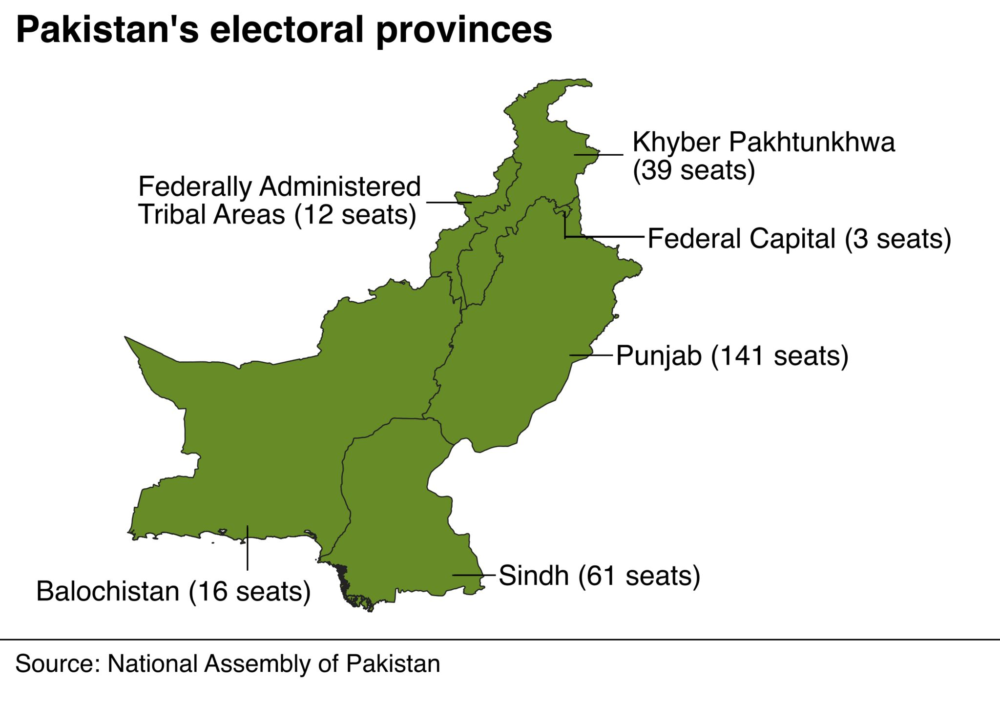

# Introduction to the analysis

Pakistan is a country, divided into states and union territories, with a parliamentary system governed under the Constitution of Pakistan, which defines the power distribution among the federal government and the states.
Election Commission is a federal body, enacted under the provisions of the Constitution, responsible for monitoring and administering all the electoral processes of Pakistan. This body is responsible for ensuring elections are free and fair, without any bias

**The Analysis here is based on the election (The General Elections) Since 1970 to 2018**
Members of National Assembly of Pakistan's Parliament are elected by being voted upon by all adult citizens of Pakistan, from a set of candidates who stand in their respective constituencies. Every adult citizen of Pakistan can vote only in their constituency. Candidates who win the NA elections are called 'Member of Parliament' and hold their seats for five years or until the body is dissolved by the President on the advice of the council of ministers. The members meets in the Parliament house Islamabad, on matters relating to creation of new laws, removing or improving the existing laws that affect all citizens of Pakistan. 

# Presenting an view before going into the Analysis

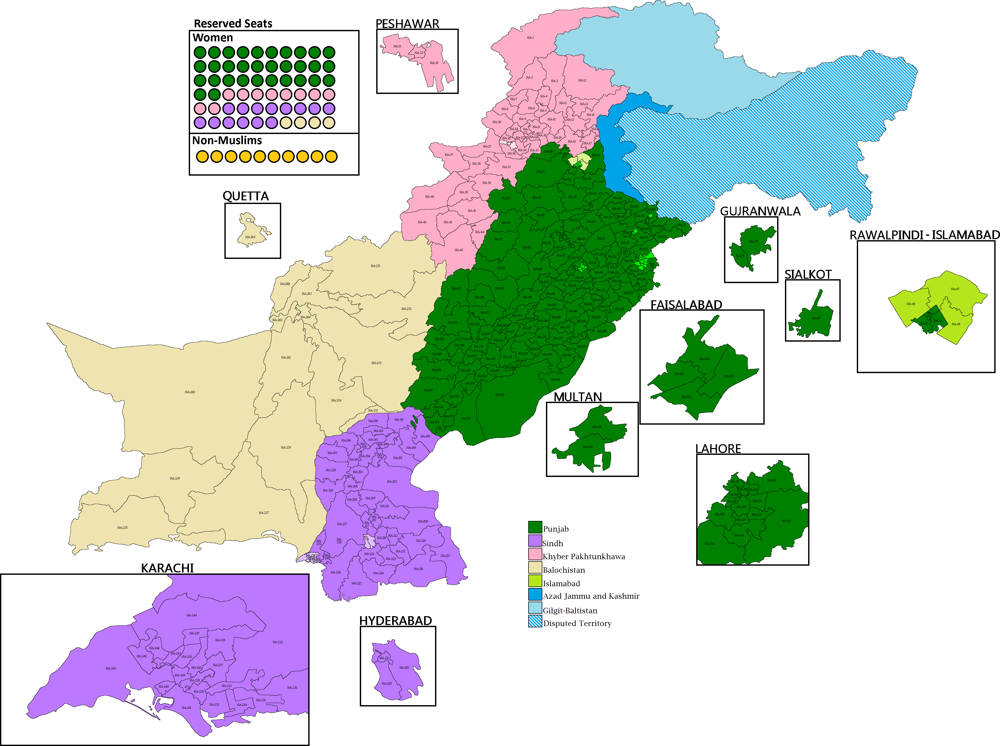

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pyreadstat as pyr
import seaborn as sns
import plotly.express as px
import plotly.express as ex
import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
import plotly.graph_objects as go
import random
import matplotlib.patches as mpatches
# Project Specific Imports
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split,GridSearchCV
sns.set_context("poster", font_scale=1, rc={"lines.linewidth": 1, 'figure.figsize':(10,5)})
sns.set_style("white")
#sns.set(font_scale=1.5)

# # Lets Check out the data

In [2]:
data=pd.read_csv("F:/SAM project/election dataset/Election.csv",encoding = 'unicode_escape')
df1=pd.read_csv("F:/Temp/Elections Database.csv")
na_c=pd.read_csv("F:/Temp/2013-2018 Seat Changes in NA (version 1).csv")
data.head()

,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,ValidVotes,RejectedVotes,Regd_Voters,Total_Votes,Turnout,turnout_n,Party,Merge_Party,Six_parties
0,1970,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Khan Abdul Qayoom Khan,27215,91040,1388,148708,92428,62,62.15401996,PML-Q,Pakistan Muslim League(Qayyum Group),PML (s)/IJI/PNA
1,1970,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Hayat Khan Sherpao,23981,,,,,,,PPP,Pakistan Peoples Party/ Pakistan Democratic Al...,PPP (s)/PDA
2,1970,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Arbab Sikandar Khan,21622,,,,,,,NAP-W,Pakistan National Awami Party (Wali Khan Group),Province Parties
3,1970,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Molana Abdul Qayoom Popalzai,13248,,,,,,,JUI-W.P,Jamiat Ulema-e-Islam (West Pakistan),Religious Parties
4,1970,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Alfred Peter,2499,,,,,,,PML,Pakistan Masihi League,Other Parties


# To help our Analysis, lets go for some...

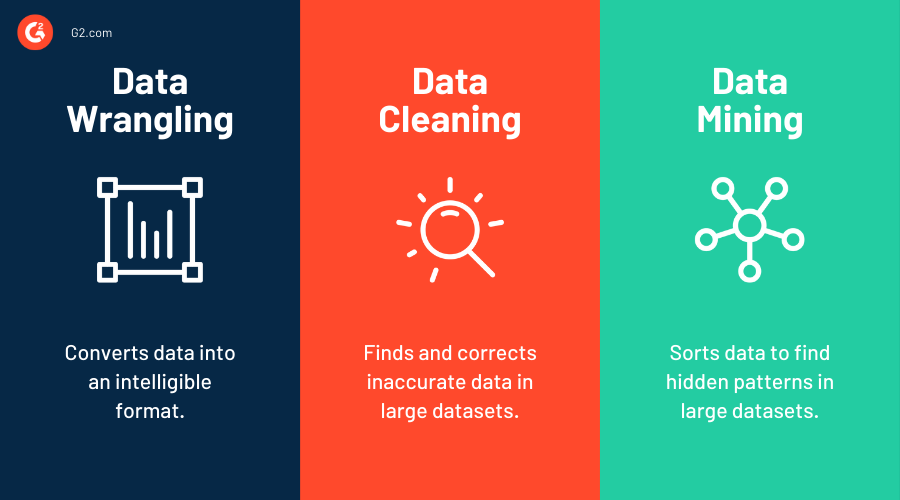

## Creating Backup of dataset

In [3]:
df=data.copy()

## viewing no of rows and columns 

In [4]:
df.shape

(19540, 18)

## Getting info about Data type and values

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19540 entries, 0 to 19539
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Year                  19540 non-null  object
 1   NA                    19540 non-null  int64 
 2   final_alpha_District  19540 non-null  object
 3   division              19540 non-null  object
 4   Prov                  19540 non-null  object
 5   zones_20              19540 non-null  object
 6   Regions_12            19540 non-null  object
 7   CandidateName         19540 non-null  object
 8   Votes                 19539 non-null  object
 9   ValidVotes            19539 non-null  object
 10  RejectedVotes         19539 non-null  object
 11  Regd_Voters           19538 non-null  object
 12  Total_Votes           19538 non-null  object
 13  Turnout               19419 non-null  object
 14  turnout_n             19538 non-null  object
 15  Party                 19538 non-null

## Getting Top/Bottom values

In [6]:
df.head(1)

,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,ValidVotes,RejectedVotes,Regd_Voters,Total_Votes,Turnout,turnout_n,Party,Merge_Party,Six_parties
0,1970,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Khan Abdul Qayoom Khan,27215,91040,1388,148708,92428,62,62.15401996,PML-Q,Pakistan Muslim League(Qayyum Group),PML (s)/IJI/PNA


In [7]:
df.tail(1)

,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,ValidVotes,RejectedVotes,Regd_Voters,Total_Votes,Turnout,turnout_n,Party,Merge_Party,Six_parties
19539,2018,272,Lasbela,Lasbela-cum-Gwadar,Balochistan,Kalat Division,Kech and Makran Region,Wazeer Ahmed Norani,4604,189425,10433,0,0,NaN,56.02,Tehreek-e-Labbaik Pakistan,NaN,NaN


## #Removing unwanted columns from dataset using 'drop'.

In [8]:
df = df.drop(['final_alpha_District','Merge_Party','division','Regions_12','Six_parties','zones_20','Turnout'],axis=1)

## Renaming column names of more than one header

In [9]:
df.rename(columns={"CandidateName":"Candidate Names","Regd_Voters":"Registered Voters", "ValidVotes": "Valid Votes", "RejectedVotes":"Rejected Votes", "Prov": "Province", "turnout_n" : "Turnout", "Total_Votes":"Total Votes Polled", "Votes":"Votes Polled" }, inplace=True)

## Identifying the Data Type of the columns & Correcting data type

* To identify the data type:  use <b>dataframe.dtypes()</b> 
* To convert data type: use <b>dataframe.astypes()</b> 

#for conversion of data type from one data to another data type

In [10]:
df.dtypes

Year                  object
NA                     int64
Province              object
Candidate Names       object
Votes Polled          object
Valid Votes           object
Rejected Votes        object
Registered Voters     object
Total Votes Polled    object
Turnout               object
Party                 object
dtype: object

In [11]:
#Check a particular column type
df['Registered Voters'].dtypes

dtype('O')

In [12]:
df['Registered Voters'] = pd.to_numeric(df['Registered Voters'],errors = 'coerce')
df['Total Votes Polled'] = pd.to_numeric(df['Total Votes Polled'],errors = 'coerce')
df['Votes Polled'] = pd.to_numeric(df['Votes Polled'],errors = 'coerce')
df['Valid Votes'] = pd.to_numeric(df['Valid Votes'],errors = 'coerce')
df['Rejected Votes'] = pd.to_numeric(df['Rejected Votes'],errors = 'coerce')
df['Turnout'] = pd.to_numeric(df['Turnout'],errors = 'coerce')

In [13]:
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Pakistan Tehreek e Insaf","PTI")
df1['Merge_Party'] =df1['Merge_Party'].str.replace('Pakistan Muslim League (Nawaz Group) / IJI',"PML")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Pakistan Peoples Party/ Pakistan Democratic Allliance","PPP")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Independent","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Muttahidda Majlis-e-Amal","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Muttahida Qaumi Movement Pakistan","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Pakistan Muslim Leaugue Quaid e Azam","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Balochistan Awami Party","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Grand Democratic Alliance","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Awami National Party","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Pakistan Tehreek-e-Insaniat","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Awami Muslim League Pakistan","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Jamhori Wattan Party","Others")
df1['Merge_Party'] =df1['Merge_Party'].str.replace("Balochistan National Party","Others")
#df1['Merge_Party'].value_counts()
df1=df1.reset_index()

In [14]:
col1=['Votes', 'ValidVotes', 'RejectedVotes', 'Regd_Voters', 'Total_Votes', 'Turnout', 'turnout_n']
#df[col1] = pd.to_numeric(df['col1'], errors='coerce')
df1['ValidVotes'] = pd.to_numeric(df1['ValidVotes'], errors='coerce')
df1['RejectedVotes'] = pd.to_numeric(df1['RejectedVotes'], errors='coerce')
df1['Total_Votes'] = pd.to_numeric(df1['Total_Votes'], errors='coerce')
df1['Year'] = pd.to_numeric(df1['Year'], errors='coerce')
df1['Turnout'] = pd.to_numeric(df1['Turnout'], errors='coerce')
df1['Votes'] = pd.to_numeric(df1['Votes'], errors='coerce')
df1['Regd_Voters'] = pd.to_numeric(df1['Regd_Voters'], errors='coerce')
#df['RejectedVotes'] = df['RejectedVotes'].apply(lambda x: float(x.split()[0].replace('$', '')))

In [15]:
df1 =df1.dropna(how='all')
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19420 entries, 0 to 19419
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   index                 19420 non-null  int64  
 1   Year                  19420 non-null  int64  
 2   NA                    19420 non-null  int64  
 3   final_alpha_District  19420 non-null  object 
 4   division              19420 non-null  object 
 5   Prov                  19420 non-null  object 
 6   zones_20              19420 non-null  object 
 7   Regions_12            19420 non-null  object 
 8   CandidateName         19420 non-null  object 
 9   Votes                 19245 non-null  float64
 10  ValidVotes            2210 non-null   float64
 11  RejectedVotes         2072 non-null   float64
 12  Regd_Voters           2245 non-null   float64
 13  Total_Votes           2074 non-null   float64
 14  Turnout               1798 non-null   float64
 15  turnout_n          

In [16]:
df.dtypes

Year                   object
NA                      int64
Province               object
Candidate Names        object
Votes Polled          float64
Valid Votes           float64
Rejected Votes        float64
Registered Voters     float64
Total Votes Polled    float64
Turnout               float64
Party                  object
dtype: object

## Checking summary of all columns of dataset
- **computes a summary of statistics pertaining to the DataFrame columns**
- minimum 
* maximum
* standard deviation
* 25%
* 50%
* 75%

In [17]:
df.describe()

,NA,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout
count,19540.000000,19364.000000,9.608000e+03,9471.000000,9.642000e+03,9471.000000,9466.000000
mean,128.280450,14236.551229,1.610800e+05,5018.919755,1.993040e+05,102741.601098,50.267371
std,385.821572,25152.734183,6.309983e+04,3434.661428,1.625397e+05,86976.819750,13.160307
min,1.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000
25%,54.000000,210.000000,1.177470e+05,2280.000000,0.000000e+00,0.000000,42.550000
50%,123.000000,1208.000000,1.679950e+05,4766.000000,2.528125e+05,117280.000000,53.000000
75%,190.000000,16368.500000,1.999180e+05,6953.000000,3.236505e+05,177397.000000,58.480000
max,52981.000000,192638.000000,1.117513e+06,25562.000000,3.022628e+06,404723.000000,467.185008


## only catagorical values

In [18]:
df.describe(include=['O'])

,Year,Province,Candidate Names,Party
count,19540,19540,19540,19538
unique,11,5,16751,452
top,2013,Punjab,Muhammad Aslam,Independent
freq,4510,9315,16,6722


In [19]:
df.describe(include='all')
#it would generate the descriptive statistics of all columns including catagorical/object columns as well as quantative columns

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
count,19540,19540.000000,19540,19540,19364.000000,9.608000e+03,9471.000000,9.642000e+03,9471.000000,9466.000000,19538
unique,11,NaN,5,16751,NaN,NaN,NaN,NaN,NaN,NaN,452
top,2013,NaN,Punjab,Muhammad Aslam,NaN,NaN,NaN,NaN,NaN,NaN,Independent
freq,4510,NaN,9315,16,NaN,NaN,NaN,NaN,NaN,NaN,6722
mean,NaN,128.280450,NaN,NaN,14236.551229,1.610800e+05,5018.919755,1.993040e+05,102741.601098,50.267371,NaN
std,NaN,385.821572,NaN,NaN,25152.734183,6.309983e+04,3434.661428,1.625397e+05,86976.819750,13.160307,NaN
min,NaN,1.000000,NaN,NaN,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,NaN
25%,NaN,54.000000,NaN,NaN,210.000000,1.177470e+05,2280.000000,0.000000e+00,0.000000,42.550000,NaN
50%,NaN,123.000000,NaN,NaN,1208.000000,1.679950e+05,4766.000000,2.528125e+05,117280.000000,53.000000,NaN
75%,NaN,190.000000,NaN,NaN,16368.500000,1.999180e+05,6953.000000,3.236505e+05,177397.000000,58.480000,NaN


## Getting Missing values

In [20]:
df.isnull()

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
0,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,True,True,True,True,True,False
2,False,False,False,False,False,True,True,True,True,True,False
3,False,False,False,False,False,True,True,True,True,True,False
4,False,False,False,False,False,True,True,True,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...
19535,False,False,False,False,False,False,False,False,False,False,False
19536,False,False,False,False,False,False,False,False,False,False,False
19537,False,False,False,False,False,False,False,False,False,False,False
19538,False,False,False,False,False,False,False,False,False,False,False


In [21]:
df[df['Votes Polled'].isnull()]

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
830,1977,10,KPK,Mr. Gul Zaman,NaN,NaN,NaN,NaN,NaN,NaN,IND
841,1977,13,KPK,Sardar Mumtaz Alam,NaN,NaN,NaN,NaN,NaN,NaN,IND
842,1977,13,KPK,Mr.Mohammad Azam Khan,NaN,NaN,NaN,NaN,NaN,NaN,IND
857,1977,16,KPK,Mr.Dilawar Khan,NaN,NaN,NaN,NaN,NaN,NaN,PML Q
858,1977,16,KPK,Syed Chiraghud din Shah,NaN,NaN,NaN,NaN,NaN,NaN,IND
...,...,...,...,...,...,...,...,...,...,...,...
4396,1993,34,KPK,Haji Malik Said Amir,NaN,NaN,NaN,NaN,NaN,NaN,IND
4397,1993,34,KPK,Malik Misal Khan,NaN,NaN,NaN,NaN,NaN,NaN,IND
5338,1993,187,Sindh,Mr.Sleem Fahmi,NaN,NaN,NaN,NaN,NaN,NaN,GAP
10795,2008,188,Punjab,Muhammad Akhtar Khadim Alias,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
df.isnull().sum()

Year                      0
NA                        0
Province                  0
Candidate Names           0
Votes Polled            176
Valid Votes            9932
Rejected Votes        10069
Registered Voters      9898
Total Votes Polled    10069
Turnout               10074
Party                     2
dtype: int64

In [23]:
df.shape

(19540, 11)

In [24]:
df.dropna(how = 'any',inplace = True)

In [25]:
df.isnull().sum()

Year                  0
NA                    0
Province              0
Candidate Names       0
Votes Polled          0
Valid Votes           0
Rejected Votes        0
Registered Voters     0
Total Votes Polled    0
Turnout               0
Party                 0
dtype: int64

In [26]:
df.dtypes

Year                   object
NA                      int64
Province               object
Candidate Names        object
Votes Polled          float64
Valid Votes           float64
Rejected Votes        float64
Registered Voters     float64
Total Votes Polled    float64
Turnout               float64
Party                  object
dtype: object

In [27]:
#df = df.fillna(method='ffill')

In [28]:
df.head(10)

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
0,1970,1,KPK,Khan Abdul Qayoom Khan,27215.0,91040.0,1388.0,148708.0,92428.0,62.154020,PML-Q
6,1970,2,KPK,Ghulam Farooq,34402.0,85110.0,2010.0,154237.0,87120.0,56.484501,NAP-W
11,1970,3,KPK,Khan Abdul Wali Khan,35220.0,73807.0,1926.0,131538.0,75733.0,57.574997,NAP-W
15,1970,4,KPK,Molana Abdul Haq,29856.0,82615.0,1384.0,133624.0,83999.0,62.862210,JUI-W.P
20,1970,5,KPK,Molana Abdul Hakeem,12915.0,27801.0,1109.0,97637.0,28910.0,29.609677,JUI-W.P
23,1970,6,KPK,Molana Ghulam Ghous Hazarvi,27188.0,70140.0,1922.0,185960.0,72132.0,38.788987,JUI-W.P
29,1970,7,KPK,Sardar Inayatur Rehman,39746.0,86699.0,2516.0,199618.0,89215.0,44.692863,PML-Q
38,1970,8,KPK,Abdul Qayum Khan,38305.0,82347.0,2751.0,201127.0,85098.0,42.310580,PML-Q
44,1970,9,KPK,Abdul Khaliq Khan,26653.0,97348.0,2060.0,155505.0,99408.0,63.925919,PPP
51,1970,10,KPK,Amirzada Khan,34032.0,83371.0,2162.0,119254.0,85533.0,71.723380,NAP-W


## Checking Duplicates in the whole dataset

In [29]:
df.duplicated().sum()

0

In [30]:
#Check duplicated rows
df.loc[df.duplicated(keep=False)]

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party


## Deleting Duplicates rows from the data

In [31]:
# dropping ALL duplicte values 
# df.drop_duplicates()
#it would temporarily drop the duplicate values untill we would not use inplace=true
df.drop_duplicates(inplace=True)

In [32]:
df.head(10)

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
0,1970,1,KPK,Khan Abdul Qayoom Khan,27215.0,91040.0,1388.0,148708.0,92428.0,62.154020,PML-Q
6,1970,2,KPK,Ghulam Farooq,34402.0,85110.0,2010.0,154237.0,87120.0,56.484501,NAP-W
11,1970,3,KPK,Khan Abdul Wali Khan,35220.0,73807.0,1926.0,131538.0,75733.0,57.574997,NAP-W
15,1970,4,KPK,Molana Abdul Haq,29856.0,82615.0,1384.0,133624.0,83999.0,62.862210,JUI-W.P
20,1970,5,KPK,Molana Abdul Hakeem,12915.0,27801.0,1109.0,97637.0,28910.0,29.609677,JUI-W.P
23,1970,6,KPK,Molana Ghulam Ghous Hazarvi,27188.0,70140.0,1922.0,185960.0,72132.0,38.788987,JUI-W.P
29,1970,7,KPK,Sardar Inayatur Rehman,39746.0,86699.0,2516.0,199618.0,89215.0,44.692863,PML-Q
38,1970,8,KPK,Abdul Qayum Khan,38305.0,82347.0,2751.0,201127.0,85098.0,42.310580,PML-Q
44,1970,9,KPK,Abdul Khaliq Khan,26653.0,97348.0,2060.0,155505.0,99408.0,63.925919,PPP
51,1970,10,KPK,Amirzada Khan,34032.0,83371.0,2162.0,119254.0,85533.0,71.723380,NAP-W


In [33]:
df.duplicated().sum()

0

## Checking for duplicates in a specefic column

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9462 entries, 0 to 19539
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Year                9462 non-null   object 
 1   NA                  9462 non-null   int64  
 2   Province            9462 non-null   object 
 3   Candidate Names     9462 non-null   object 
 4   Votes Polled        9462 non-null   float64
 5   Valid Votes         9462 non-null   float64
 6   Rejected Votes      9462 non-null   float64
 7   Registered Voters   9462 non-null   float64
 8   Total Votes Polled  9462 non-null   float64
 9   Turnout             9462 non-null   float64
 10  Party               9462 non-null   object 
dtypes: float64(6), int64(1), object(4)
memory usage: 887.1+ KB


In [35]:
df['Year'].unique()

array(['1970', '1977', '1988', '1990', '1993', '1997', '2002', '2008',
       '2013', '2018'], dtype=object)

In [36]:
i = df[(df.Year == 'Khadim Hussain.')].index

df = df.drop(i)


In [37]:
#df['Party'].unique()

In [38]:
#df['Year'].unique()
df['Candidate Names'].unique()

array(['Khan Abdul Qayoom Khan', 'Ghulam Farooq', 'Khan Abdul Wali Khan',
       ..., 'Muhammad Akhtar mengal', 'Nawab Khan Bizenjo',
       'Wazeer Ahmed Norani'], dtype=object)

## Calculating average turnout of election of 10 Elections using group by.

In [39]:
df_turnout = df.groupby("Year")['Turnout'].mean()
df_total_mean = df_turnout.mean()
df_total_mean

46.94136663796754

## Calculating average turn out of every single election using groupby.

In [40]:
df_turnout_year = df.groupby("Year")['Turnout']
df_turnout_year.mean()

Year
1970    64.058247
1977    47.485900
1988    44.262311
1990    48.128821
1993    41.644721
1997    36.042647
2002    40.918246
2008    44.762826
2013    53.199855
2018    48.910093
Name: Turnout, dtype: float64

<h1 style="text-align: center;"> <u>Data Visualization </u> </h1>

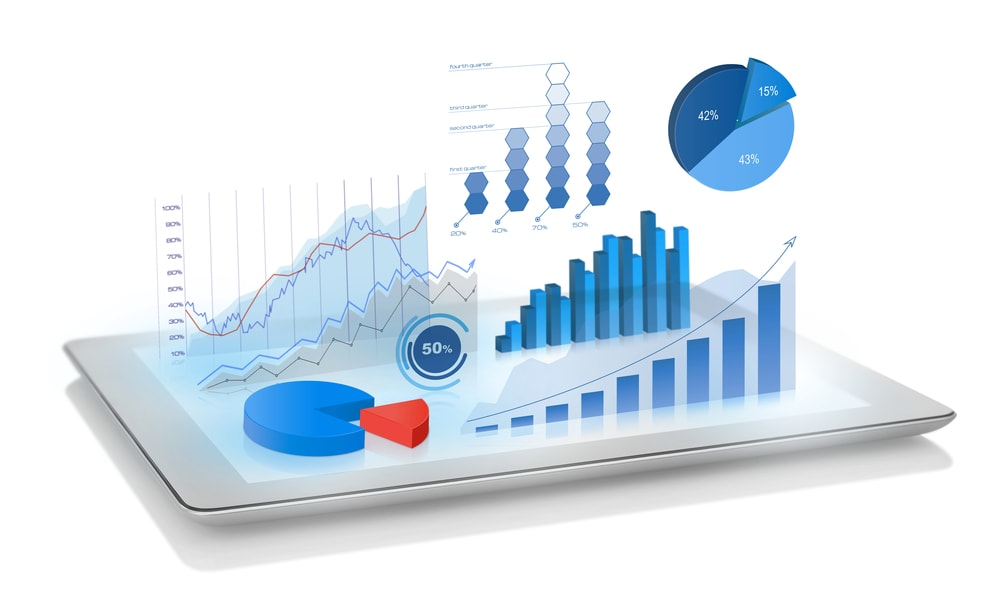

In [41]:
#ax = sns.pairplot(df);
#sns.pairplot(df)
#sns.pairplot(iris, diag_kind="kde")
#sns.pairplot(df, hue="species")
#sns.pairplot(df, hue="species", markers=["o", "s", "D"])

<Figure size 4000x4000 with 0 Axes>

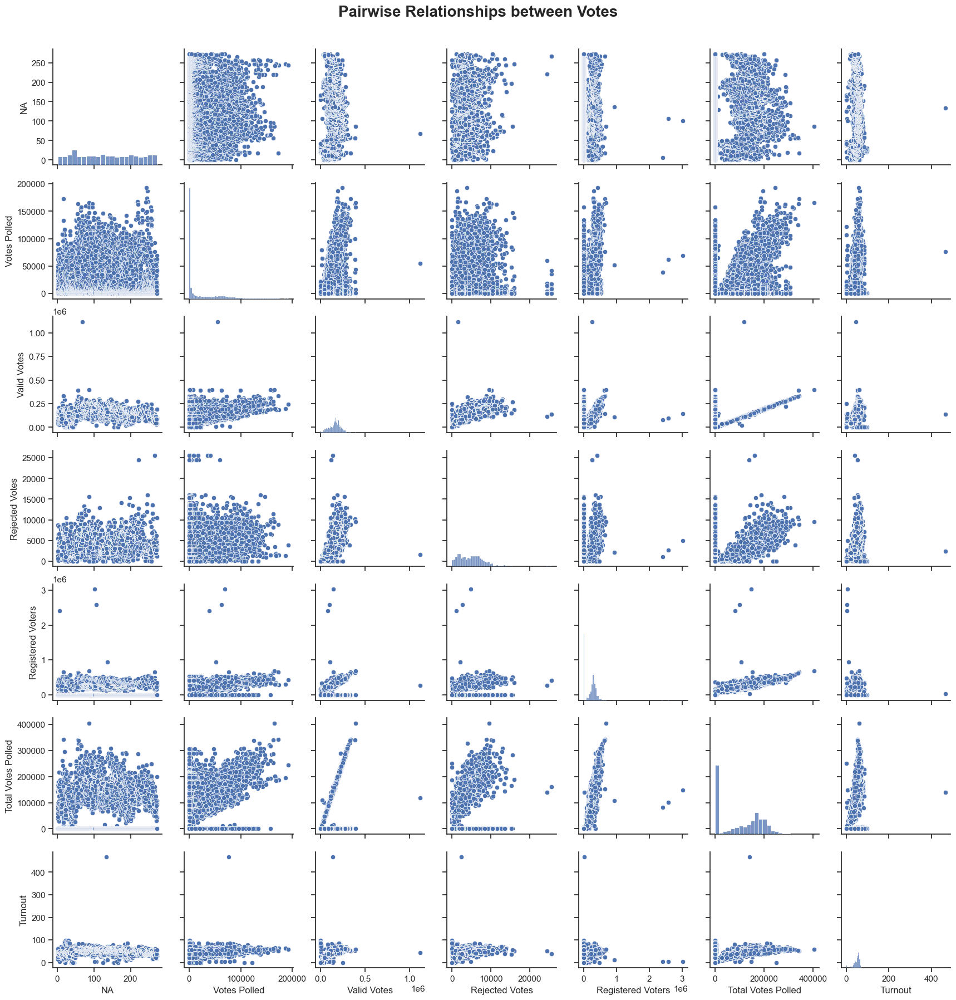

In [42]:
ax = plt.figure(dpi=200,figsize=(20,20));
sns.set(style="ticks", color_codes=True)
ax = sns.pairplot(df);
ax.fig.suptitle("Pairwise Relationships between Votes", y=1.03, fontsize=20, fontweight='bold');

(array([   0., 1000., 2000., 3000., 4000., 5000.]),
 [Text(0, 0.0, '0'),
  Text(0, 1000.0, '1000'),
  Text(0, 2000.0, '2000'),
  Text(0, 3000.0, '3000'),
  Text(0, 4000.0, '4000'),
  Text(0, 5000.0, '5000')])

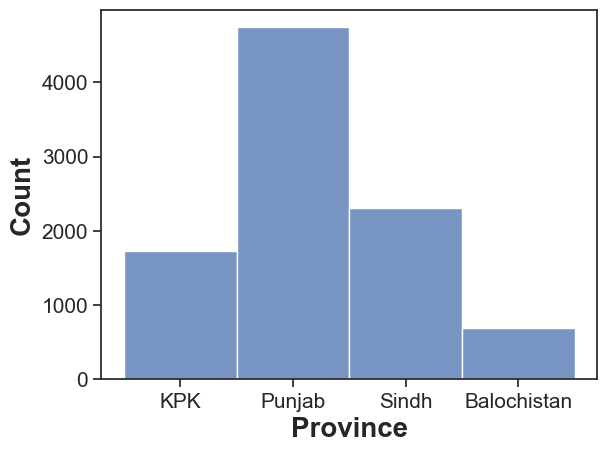

In [43]:
sns.histplot(df['Province'],bins=4)
plt.xticks(rotation=0)
plt.xlabel('Province',fontsize=20, fontweight='bold')
plt.xticks(fontsize=15)
plt.ylabel('Count',fontsize=20, fontweight='bold')
plt.yticks(fontsize=15)

In [44]:
df.dtypes

Year                   object
NA                      int64
Province               object
Candidate Names        object
Votes Polled          float64
Valid Votes           float64
Rejected Votes        float64
Registered Voters     float64
Total Votes Polled    float64
Turnout               float64
Party                  object
dtype: object

## Year wise plot average turnout of election via line chart (years on x-axis and average turn out on the y-axis).

In [45]:
#df.groupby('Year')['Turnout'].mean().plot(kind='line')

In [46]:
#plt.figure(figsize=(10,7))
#plt.plot(df_turnout_year.mean())
#plt.ylabel('Turnout')
#plt.grid(axis='y', alpha=0.75)
#plt.grid(axis='x', alpha=0.75)
#plt.hlines(df_total_mean, xmin=0, xmax=10, linewidth=3, color='red', linestyle='--', label='Mean')
#plt.xlabel('Year',fontsize=20, fontweight='bold')
#plt.xticks(fontsize=15)
#plt.ylabel('Turnout',fontsize=20, fontweight='bold')
#plt.yticks(fontsize=15)
#plt.show()

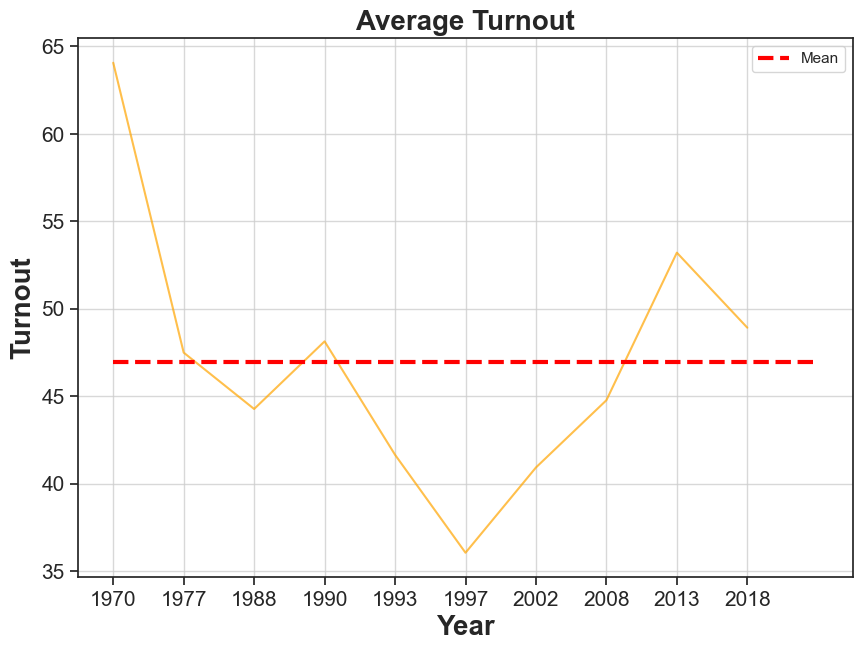

In [47]:
plt.figure(figsize=(10,7))
plt.plot(df_turnout_year.mean(), alpha=0.7, color='orange')  # `density=False` would make counts
plt.grid(axis='y', alpha=0.75)
plt.grid(axis='x', alpha=0.75)
plt.xlabel('Year')
plt.ylabel('Turnout')
plt.title('Average Turnout',fontsize=20, fontweight='bold')
plt.xlabel('Year',fontsize=20, fontweight='bold')
plt.xticks(fontsize=15)
plt.ylabel('Turnout',fontsize=20, fontweight='bold')
plt.yticks(fontsize=15)

# Plot black line at mean
plt.hlines(df_total_mean, xmin=0, xmax=10, linewidth=3, color='red', linestyle='--', label='Mean')
plt.legend()

## Filter out rows for the year 2018 and remove empty rows

In [48]:
df_drop_missing = df
df_turnout_2018 = df_drop_missing[['Year', 'Turnout']]
turnout_2018 = df_turnout_2018.apply(lambda x: x['Year'] == "2018", axis=1)
df_turnout_2018 = df_turnout_2018[turnout_2018]
df_turnout_2018 = df_turnout_2018.dropna()
df_turnout_2018.head(10)


,Year,Turnout
16112,2018,60.97
16113,2018,60.97
16114,2018,60.97
16115,2018,60.97
16116,2018,60.97
16117,2018,60.97
16118,2018,60.97
16119,2018,60.97
16120,2018,60.97
16121,2018,60.97


In [49]:
df_Turnout=df[['Turnout']]
df_Turnout.head()

,Turnout
0,62.154020
6,56.484501
11,57.574997
15,62.862210
20,29.609677


## Plot histogram of election turnout for year 2018

Text(0.5, 1.0, '2018 Election Turnout')

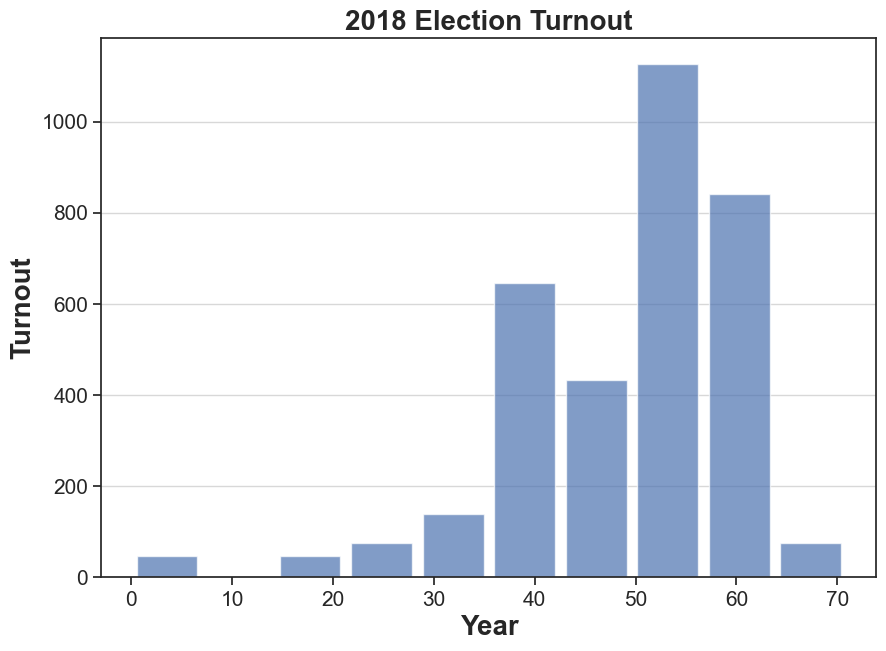

In [50]:
plt.figure(figsize=(10,7))
plt.hist(df_turnout_2018['Turnout'], alpha=0.7, rwidth=0.85 )  # `density=False` would make counts
plt.grid(axis='y', alpha=0.75)
plt.xlabel('Year',fontsize=20, fontweight='bold')
plt.xticks(fontsize=15)
plt.ylabel('Turnout',fontsize=20, fontweight='bold')
plt.yticks(fontsize=15)
plt.title('2018 Election Turnout',fontsize=20, fontweight='bold')
# Plot black line at mean


## Then plot mean median and mode of election turn out on the histogram of election turnout

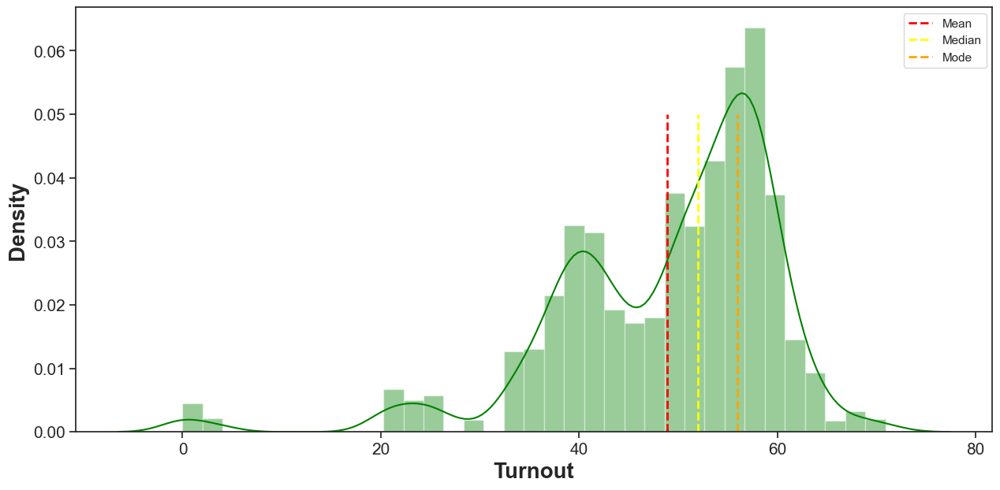

In [51]:
plt.rcParams["figure.figsize"] = [15, 7]
sns.distplot(df_turnout_2018['Turnout'], color='green')
# Plot black line at mean
plt.vlines(df_turnout_2018['Turnout'].mean(), ymin=0, ymax=0.05, linewidth=2, color='red', linestyle='--', label='Mean')
plt.vlines(df_turnout_2018['Turnout'].median(), ymin=0, ymax=0.05, linewidth=2, color='yellow', linestyle='--', label='Median')
plt.vlines(df_turnout_2018['Turnout'].astype(int) .mode(), ymin=0, ymax=0.05, linewidth=2, color='orange', linestyle='--', label='Mode')
plt.xlabel('Turnout',fontsize=20, fontweight='bold')
plt.xticks(fontsize=15)
plt.ylabel('Density',fontsize=20, fontweight='bold')
plt.yticks(fontsize=15)
plt.legend()

## Filter out rows for the year 2018 and remove empty rows

In [52]:
df_turnout_2018_2 = df_drop_missing
turnout_2018_2 = df_turnout_2018_2.apply(lambda x: x['Year'] == "2018", axis=1)
df_turnout_2018_2 = df_turnout_2018_2[turnout_2018_2]
df_turnout_2018_2 = df_turnout_2018_2.dropna()
df_turnout_2018_2.head(10)

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
16112,2018,1,KPK,Moulana Abdul Akbar Chitrali,48616.0,158925.0,5430.0,269579.0,164355.0,60.97,Muttahida Majlis-e-Amal Pakistan
16113,2018,1,KPK,Saeed ur Rehman,3223.0,158925.0,5430.0,0.0,0.0,60.97,Pakistan Rah-e-Haq Party
16114,2018,1,KPK,Muhammad Yahya,698.0,158925.0,5430.0,0.0,0.0,60.97,Independent
16115,2018,1,KPK,Shahzada Muhammad Taimur Khisrao,2414.0,158925.0,5430.0,0.0,0.0,60.97,Independent
16116,2018,1,KPK,Eid Ul Hussain,3613.0,158925.0,5430.0,0.0,0.0,60.97,Awami National Party
16117,2018,1,KPK,Muhammad Amjad,6755.0,158925.0,5430.0,0.0,0.0,60.97,All Pakistan Muslim League
16118,2018,1,KPK,Taqdira Ajmal,681.0,158925.0,5430.0,0.0,0.0,60.97,Independent
16119,2018,1,KPK,Abdul Latif,38481.0,158925.0,5430.0,0.0,0.0,60.97,Pakistan Tehreek-e-Insaf
16120,2018,1,KPK,Iftikhar Ud Din,21016.0,158925.0,5430.0,0.0,0.0,60.97,Pakistan Muslim League (N)
16121,2018,1,KPK,Nisar Dastageer,793.0,158925.0,5430.0,0.0,0.0,60.97,Independent


## Plot province wise election turn out using boxplot 

(array([-10.,   0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.]),
 [Text(0, -10.0, '−10'),
  Text(0, 0.0, '0'),
  Text(0, 10.0, '10'),
  Text(0, 20.0, '20'),
  Text(0, 30.0, '30'),
  Text(0, 40.0, '40'),
  Text(0, 50.0, '50'),
  Text(0, 60.0, '60'),
  Text(0, 70.0, '70'),
  Text(0, 80.0, '80')])

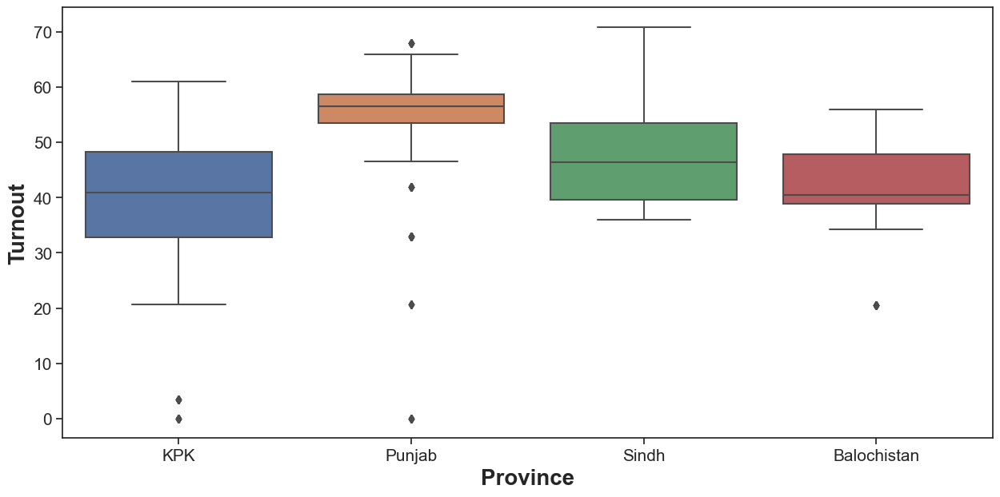

In [53]:
sns.boxplot(x = 'Province', y = 'Turnout', data = df_turnout_2018_2 )
plt.xlabel('Province',fontsize=20, fontweight='bold')
plt.xticks(fontsize=15)
plt.ylabel('Turnout',fontsize=20, fontweight='bold')
plt.yticks(fontsize=15)

**Since KPK has most Turnouts are in between median and third quartile and negative outliers at first quartile Punjab has most Turnouts are in between first quartile and median and two positive outliers and one negative outlier at far of first quartile. Sindh has more Turnouts are in between median and third quartile and no outliers Punjab has most Turnouts are in between first quartile and median and one negative outlier far from first quartile.**

## Find the Correlation between the Data:

In [55]:
#df.corr()

## Heatmap representing correlation matrix

In [56]:
#fig,ax=plt.subplots(figsize=(10,5))
#sns.heatmap(df.corr(),annot=True)

In [57]:
#px.imshow(df.corr(),height=800,width=800)

## #Using pivot function to find provincewise total no of 'Total Votes' , 'Rejected Votes' , 'Valid Votes' & 'Registered Voters' 

In [58]:
Provincewise = pd.pivot_table(df,values=['Total Votes Polled','Rejected Votes','Valid Votes','Registered Voters'],index='Province',aggfunc='max',margins=True)
Provincewise
Provincewise.style.background_gradient(cmap = "afmhot")

,Registered Voters,Rejected Votes,Total Votes Polled,Valid Votes
Province,,,,
Balochistan,651356.000000,25562.000000,199918.000000,195113.000000
KPK,2409777.000000,10510.000000,343442.000000,334580.000000
Punjab,3022628.000000,15588.000000,404723.000000,1117513.000000
Sindh,543964.000000,24516.000000,286159.000000,274686.000000
All,3022628.000000,25562.000000,404723.000000,1117513.000000


## Province Wise Total Record of Turnout

In [59]:
df.groupby('Province').size().reset_index(name='Turnout')

,Province,Turnout
0,Balochistan,693
1,KPK,1724
2,Punjab,4741
3,Sindh,2304


In [60]:
Provincewise = df.groupby(['Province']).apply(lambda x:x['Valid Votes'].nunique()).reset_index(name='# Valid Votes')
Provincewise.sort_values(by='# Valid Votes',ascending=False,inplace=True)
fig2 = px.bar(Provincewise, x='Province', y='# Valid Votes',
                     color='# Valid Votes',
             labels={'pop':'over all Valid Vote of Pakistan'})

fig2.update_layout(title_text='Provincewise distribution of the Valid Votes all over Pak',template='plotly_white', width=800 ,title_font=dict(size=25))

fig2.update_xaxes(title_font=dict(size=20))
fig2.update_yaxes(title_font=dict(size=20))

fig2.show()


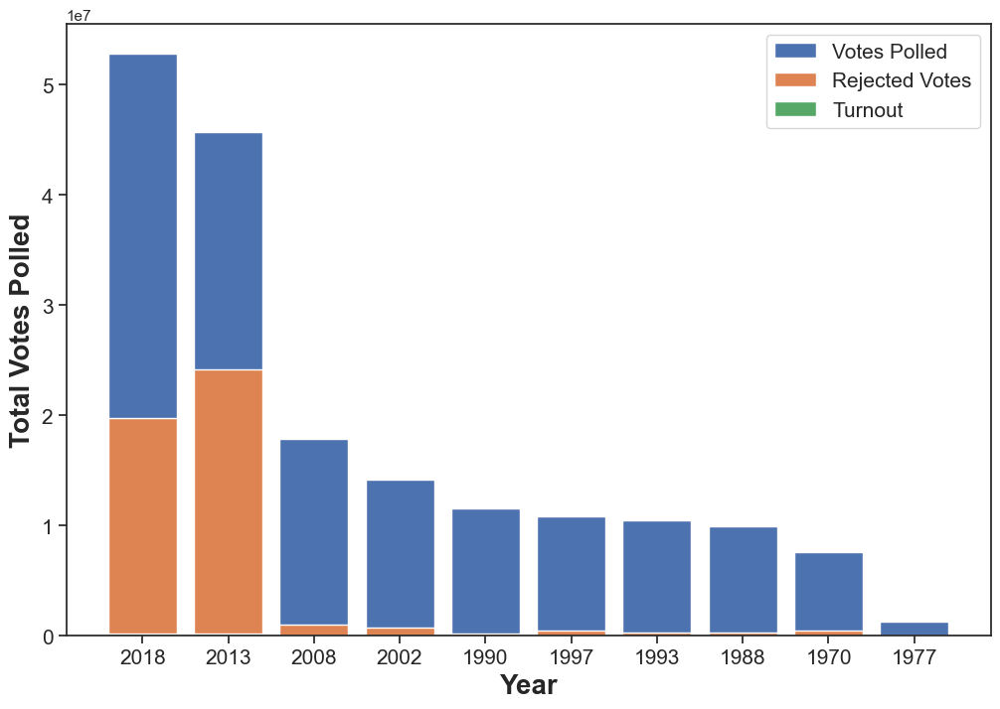

In [61]:
plt.figure(figsize=(12,8))
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel("Year",fontsize = 20, fontweight='bold')
plt.ylabel('Total Votes Polled',fontsize = 20, fontweight='bold')

a = df.groupby('Year')['Votes Polled'].sum().sort_values(ascending=False).index 
b = df.groupby('Year')['Votes Polled'].sum().sort_values(ascending=False).values
plt.bar(a,b)

x = df.groupby('Year')['Rejected Votes'].sum().sort_values(ascending=False).index
y = df.groupby('Year')['Rejected Votes'].sum().sort_values(ascending=False).values
plt.bar(x,y,)

c = df.groupby('Year')['Turnout'].sum().sort_values(ascending=False).index 
d = df.groupby('Year')['Turnout'].sum().sort_values(ascending=False).values
plt.bar(c,d)

plt.legend(["Votes Polled", 'Rejected Votes', 'Turnout'], loc ="upper right", fontsize = 15)

plt.show()

In [62]:
#sns.distplot(df['Rejected Votes'])
#plt.xlabel('Rejected Votes',  fontsize = 20 , fontweight='bold')
#plt.ylabel('Density',  fontsize = 20 , fontweight='bold')

Text(0, 0.5, 'Count')

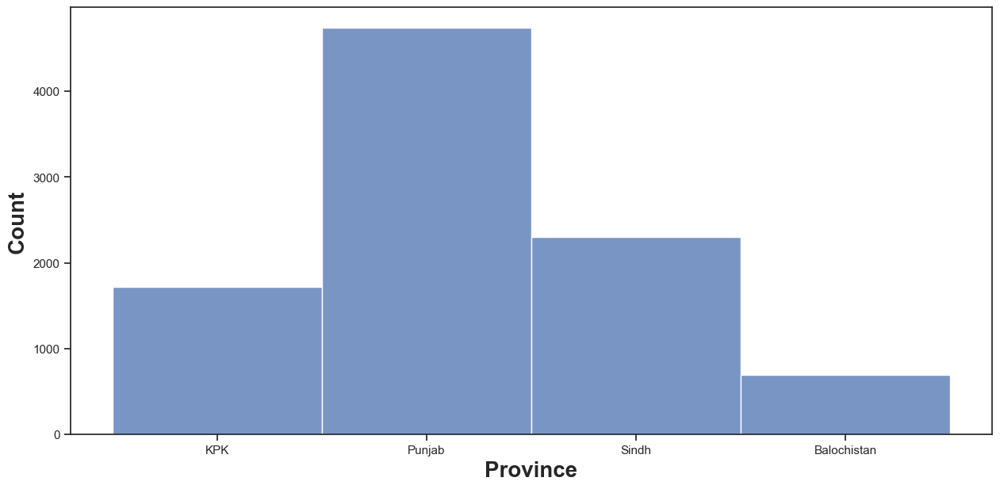

In [63]:
sns.histplot(df['Province'])
plt.xlabel('Province',  fontsize = 20 , fontweight='bold')
plt.ylabel('Count',  fontsize = 20 , fontweight='bold')

## Province with highest Registered Votes

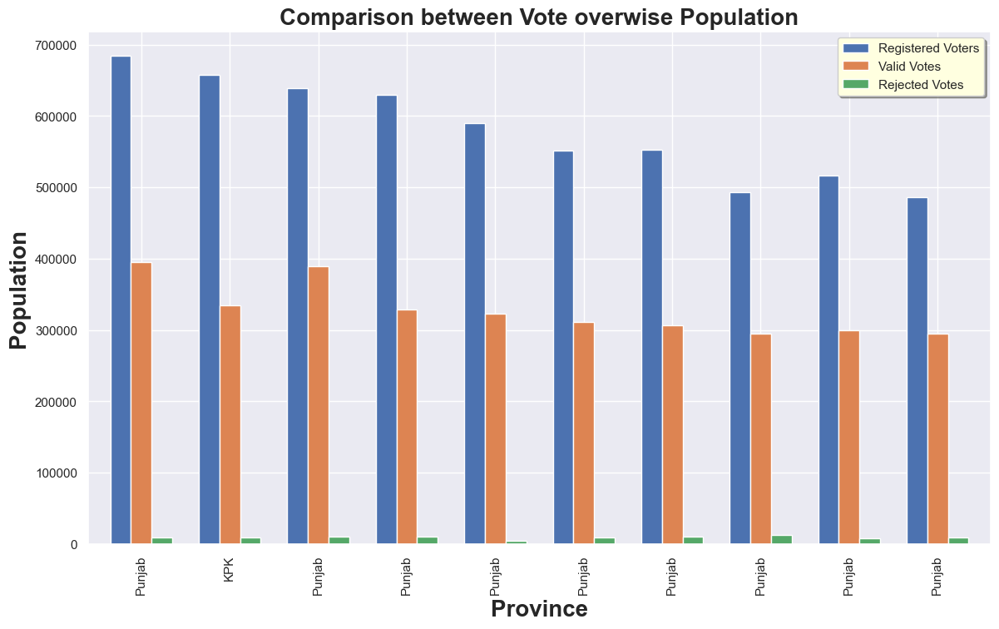

In [64]:
df.temp = df.set_index('Province')
df.temp = df.temp.sort_values('Total Votes Polled', ascending=False).head(10)
sns.set(style='darkgrid')
df.temp[['Registered Voters','Valid Votes','Rejected Votes']].plot(kind="bar", figsize=(14,8), width=0.7)
plt.xticks(rotation=90)
plt.xlabel('Province',  fontsize = 20 , fontweight='bold')
plt.ylabel('Population',  fontsize = 20 , fontweight='bold')
plt.gcf().axes[0].yaxis.get_major_formatter().set_scientific(False)
plt.legend(shadow=True, facecolor='lightyellow')

plt.title("Comparison between Vote overwise Population" , fontsize = 20 , fontweight='bold')

plt.show()

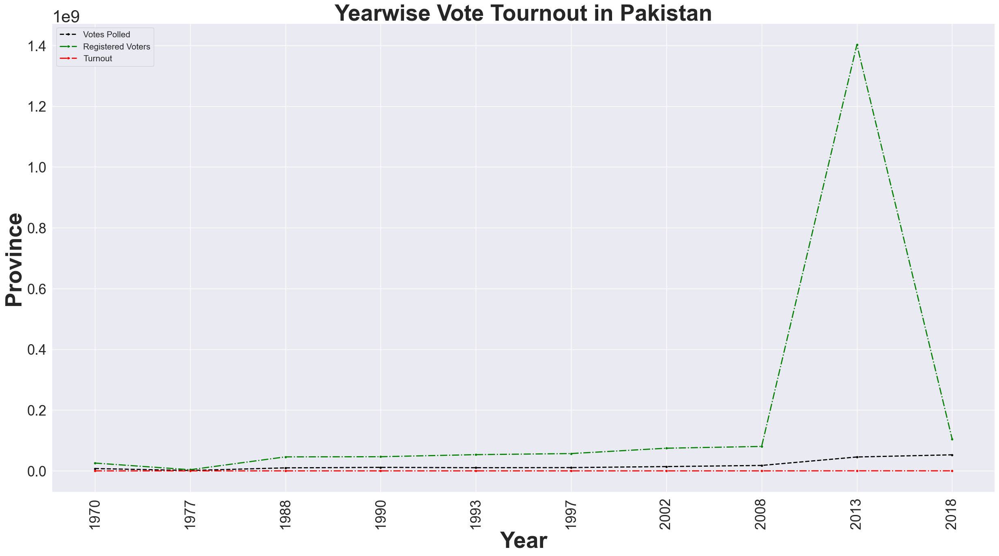

In [65]:
sns.set(font_scale=2.7)

plt.figure(figsize= (30,15))
plt.xticks(fontsize = 25)
plt.xticks(rotation = 90)
plt.yticks(fontsize = 25)
plt.xlabel("Year",fontsize = 40, fontweight='bold')
plt.ylabel('Province',fontsize = 40, fontweight='bold')
plt.title("Yearwise Vote Tournout in Pakistan" , fontsize = 40 , fontweight='bold')

a = df.groupby('Year')['Votes Polled'].sum().index 
b = df.groupby('Year')['Votes Polled'].sum().values
plt.plot(a,b, marker = '.',ls='--',lw=2,color='black')

x = df.groupby('Year')['Registered Voters'].sum().index
y = df.groupby('Year')['Registered Voters'].sum().values
plt.plot(x,y, marker = '.', ls='dashdot',lw=2,color='green')

c = df.groupby('Year')['Turnout'].sum().index 
d = df.groupby('Year')['Turnout'].sum().values
plt.plot(c,d, marker = '.', ls='dashdot',lw=2,color='red')


plt.legend(["Votes Polled", 'Registered Voters', 'Turnout'], loc ="upper left", fontsize=15)
plt.show()

<Figure size 1500x900 with 0 Axes>

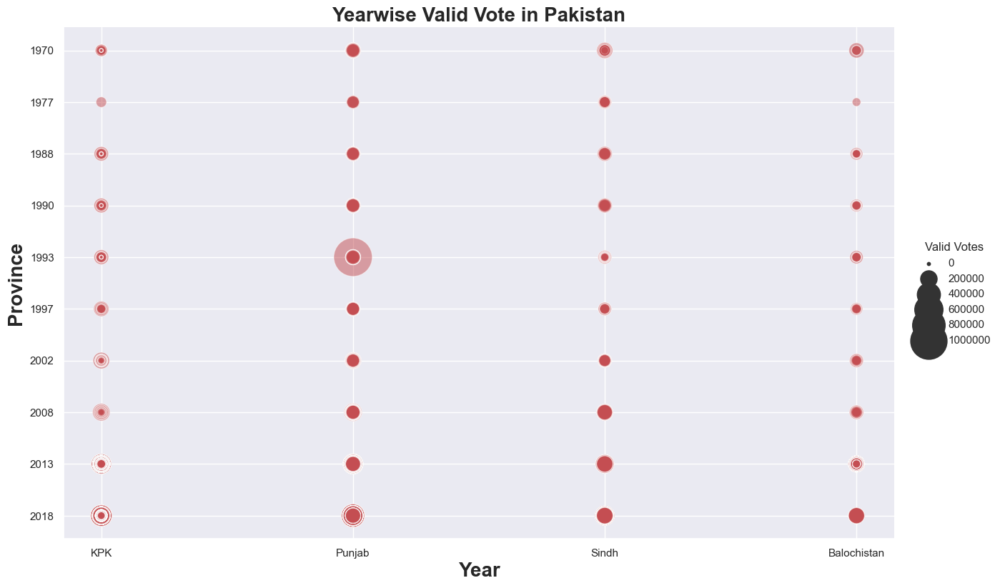

In [66]:
plt.figure(figsize=(15,9))

sns.set(font_scale=1)
sns.relplot(x="Province", y="Year", size="Valid Votes",
            sizes=(10, 1500), alpha=.5, color='r',
            height=8, aspect=1.6 , data=df).tight_layout()
plt.xlabel("Year",fontsize = 20, fontweight='bold')
plt.ylabel('Province',fontsize = 20, fontweight='bold')
plt.title("Yearwise Valid Vote in Pakistan" , fontsize = 20 , fontweight='bold')

plt.show()

## Top Partywise with different scenarios of Voting

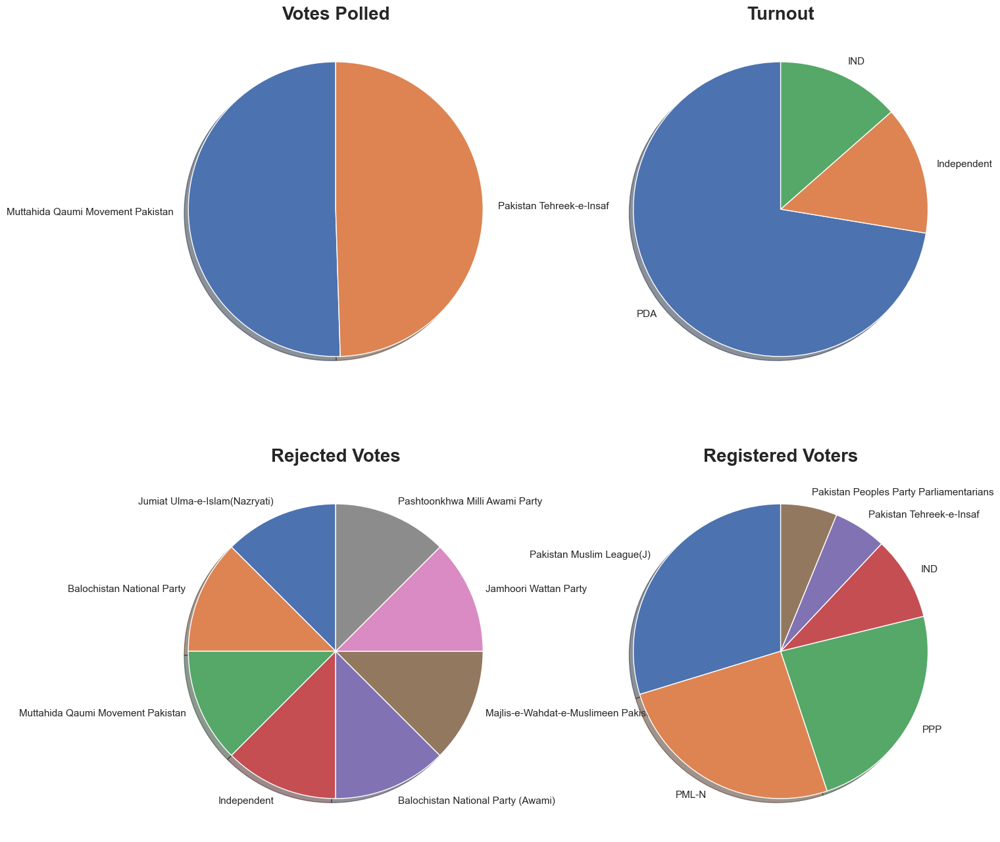

In [67]:
df_temp = df.set_index('Party')
fig, ax = plt.subplots(2, 2, figsize=(16,16))
for col, ax in zip(['Votes Polled','Turnout','Rejected Votes','Registered Voters'], ax.flat):
    dict_ = df_temp[col].sort_values(ascending=False).head(10).to_dict()
    ax.pie(x=list(dict_.values()), labels=dict_.keys(), shadow=True, startangle=90)
    ax.set_title(col, weight='bold', fontsize = 20)
plt.show()

In [68]:
#<h2 style="text-align: center;"> The End </h2>

## YEARWISE EDA 

### YEAR 2008

In [69]:
df.dtypes

Year                   object
NA                      int64
Province               object
Candidate Names        object
Votes Polled          float64
Valid Votes           float64
Rejected Votes        float64
Registered Voters     float64
Total Votes Polled    float64
Turnout               float64
Party                  object
dtype: object

In [70]:
df['Year'] = df['Year'].astype('int64')
df['Votes Polled'] = df['Votes Polled'].astype('int64')
df['Valid Votes'] = df['Valid Votes'].astype('int64')
df['Rejected Votes'] = df['Rejected Votes'].astype('int64')
df['Registered Voters'] = df['Registered Voters'].astype('int64')
df['Total Votes Polled'] = df['Total Votes Polled'].astype('int64')

In [71]:
df.shape

(9462, 11)

In [72]:
df.dtypes

Year                    int64
NA                      int64
Province               object
Candidate Names        object
Votes Polled            int64
Valid Votes             int64
Rejected Votes          int64
Registered Voters       int64
Total Votes Polled      int64
Turnout               float64
Party                  object
dtype: object

In [73]:
df.isnull().sum()

Year                  0
NA                    0
Province              0
Candidate Names       0
Votes Polled          0
Valid Votes           0
Rejected Votes        0
Registered Voters     0
Total Votes Polled    0
Turnout               0
Party                 0
dtype: int64

In [74]:
Year2008=df.loc[df['Year'] == 2008]
Year2008.head(2)

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
9396,2008,1,KPK,Haji Ghulam Ahmad Bilour,44210,88325,629,387083,88954,22.980601,Awami National Party
9409,2008,2,KPK,Dr. Arbab Alamgir Khan,34443,76293,2003,314904,78296,24.863450,Pakistan Peoples Party


In [75]:
#Year2008.isnull().sum()
Province2008 = Year2008.groupby(['Province', 'Turnout'])
Province2008.first()

Year   NA                       Candidate Names   
Province    Turnout                                                      
Balochistan 17.148687  2008  259  Syed Nasir Ali Shah alias Syed Abbas  \
            23.354817  2008  266                   Taj Muhammad Jamali   
            26.273001  2008  260          Sardar Al-Haaj Muhammad Umar   
            27.918859  2008  264                     Maulvi Asmatullah   
            31.068168  2008  268                 Dr. Ayatullah Durrani   
...                     ...  ...                                   ...   
Sindh       60.646554  2008  247                       Dr.Nadeem Ehsan   
            63.074392  2008  246                         Sufyan Yousuf   
            64.310343  2008  244                     Shaikh Salahuddin   
            65.927099  2008  229                       Arbab Zakaullah   
            66.991644  2008  230               Dr. Ghulam Hyder Samejo   

                       Votes Polled  Valid Votes  Rejected Votes   
Province    Turnout                                                
Balochistan 17.148687         24936        60817            1875  \
            23.354817         76556       145809            6314   
            26.273001         40773       100597            4175   
            27.918859         24204        58782            3290   
            31.068168         19355        62833            2682   
...                             ...          ...             ...   
Sindh       60.646554        168007       182714            1321   
            63.074392        186933       194278            1281   
            64.310343        174044       185581            1492   
            65.927099        135697       164597            3972   
            66.991644        109580       153057            6085   

                       Registered Voters  Total Votes Polled   
Province    Turnout                                            
Balochistan 17.148687             365579               62692  \
            23.354817             651356              152123   
            26.273001             398782              104772   
            27.918859             222330               62072   
            31.068168             210875               65515   
...                                  ...                 ...   
Sindh       60.646554             303455              184035   
            63.074392             310045              195559   
            64.310343             290891              187073   
            65.927099             255690              168569   
            66.991644             237555              159142   

                                                         Party  
Province    Turnout                                             
Balochistan 17.148687  Pakistan Peoples Party Parliamentarians  
            23.354817  Pakistan Peoples Party Parliamentarians  
            26.273001                   Pakistan Peoples Party  
            27.918859                              Independent  
            31.068168  Pakistan Peoples Party Parliamentarians  
...                                                        ...  
Sindh       60.646554        Muttahida Qaumi Movement Pakistan  
            63.074392        Muttahida Qaumi Movement Pakistan  
            64.310343        Muttahida Qaumi Movement Pakistan  
            65.927099                   Pakistan Muslim League  
            66.991644                   Pakistan Muslim League  

[267 rows x 9 columns]

In [76]:
Year2008.groupby('Year')['Turnout'].mean()

Year
2008    44.762826
Name: Turnout, dtype: float64

* **Get list of parties participate in 2008 election**

In [77]:
Parties_list_in_2008 = Year2008.Party.unique()
total_parties_in_2008 = len(Parties_list_in_2008)
print(total_parties_in_2008) 

12


* **Total number of seats**

In [78]:
seats_list_in_2008 = Year2008.NA.unique()
total_seats_in_2008 = len(seats_list_in_2008)
print(total_seats_in_2008)

270


In [79]:
# get the list of candidates per NA seat

In [80]:
#list_of_candidates_per_seat_2008 = Year2008.groupby(['NA']).size().reset_index(name='candidates')
#sorted_idx = (list_of_candidates_per_seat_2008.assign(ConstituencyTitle=list_of_candidates_per_seat_2008.NA).sort_values(['NA']).index)
#list_of_candidates_per_seat_2008 = list_of_candidates_per_seat_2008.iloc[sorted_idx]

#x = list_of_candidates_per_seat_2008.NA
#y = list_of_candidates_per_seat_2008.candidates

#fig = go.Figure()
#fig.add_trace(go.Scatter(x=x, y=y,
                    #mode='lines+markers',
                    #name='lines+markers'))
#fig.show()

In [81]:
#list_of_candidate_per_seat_2008 = Year2008.groupby(['NA']).size().reset_index(name='candidates')
#fig = px.bar(list_of_candidate_per_seat_2008, x='NA', y='candidates')
#fig.show()

* **Get list of candidates per NA seat**

In [82]:
from plotly.offline import iplot
data = [go.Bar(
    x=df['Year'].unique(),
    y=df.groupby(['Year'])['Candidate Names'].count(),
    textposition = 'auto',
    marker=dict(
        color=['rgba(204,204,204,1)', 'rgba(204,204,204,1)',
               'rgba(222,45,38,0.8)', 'rgba(204,204,204,1)'],
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5),
            ),
            opacity=0.6
    )]
layout = {
  'xaxis': {'title': 'Year'},
  'yaxis': {'title': 'No. of Participants'},
  'barmode': 'relative',
  'title': 'Total Number of Candidates Appeared'
};
iplot({'data': data, 'layout': layout})

In [83]:
from plotly.offline import iplot
data = [go.Bar(
    x=Year2008['Candidate Names'].unique(),
    y=Year2008.groupby(['Turnout'])['Candidate Names'].count(),
    textposition = 'auto',
    marker=dict(
        color=['rgba(204,204,204,1)', 'rgba(204,204,204,1)',
               'rgba(222,45,38,0.8)', 'rgba(204,204,204,1)'],
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5),
            ),
            opacity=0.6
    )]
layout = {
  'xaxis': {'title': 'Candidates'},
  'yaxis': {'title': 'No. of Participants'},
  'barmode': 'relative',
  'title': 'Total Number of Candidates Appeared'
};
iplot({'data': data, 'layout': layout})

* **List of candidates per party**

In [84]:
list_of_candidates_per_party_2008 = Year2008.groupby(['Party']).size().reset_index(name='candidates').sort_values('candidates', ascending=False)

fig = px.funnel(list_of_candidates_per_party_2008, x='Party', y='candidates', height=700, title='List of candidates per party')

fig.show()

<h3 style="text-align: center;"> **Number of votes per party </h3>
<h3 style="text-align: center;"> & no of seats by party for Year 2008** </h3>

In [85]:
list_of_votes_per_party_2008 = Year2008.groupby(['Party'])['Votes Polled'].sum().reset_index(name='total_votes').sort_values('total_votes', ascending=False)

fig = px.pie(list_of_votes_per_party_2008, names='Party', values='total_votes', title='Number of votes per party')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

max_votes_index_2008 = Year2008.groupby(['NA'])['Votes Polled'].idxmax()
number_of_seats_per_party_2008 = Year2008.loc[max_votes_index_2008].groupby(['Party']).size().reset_index(name='Seats').sort_values('Seats', ascending=False)

fig = px.pie(number_of_seats_per_party_2008, names='Party', values='Seats', title='Number of seats per Party')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()


* **Pairwise Relationships of Year 2008**

<Figure size 6000x6000 with 0 Axes>

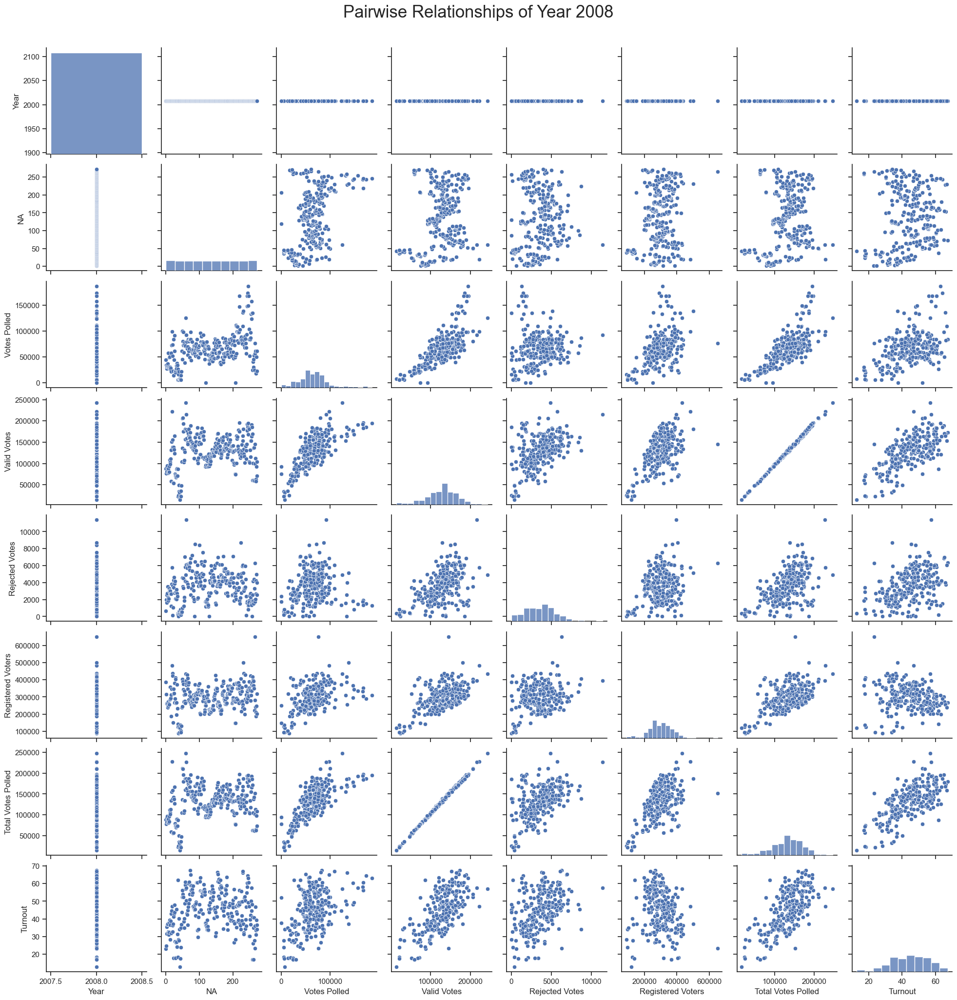

In [86]:
ax = plt.figure(dpi=200,figsize=(30,30));
sns.set(style="ticks", color_codes=True)

ax = sns.pairplot(Year2008);
ax.fig.suptitle("Pairwise Relationships of Year 2008", y=1.03, fontsize=25);


* **Number of parties reahed in Assembly in 2008**

In [87]:
number_of_parties_in_assembly_2008 = len(number_of_seats_per_party_2008)
number_of_parties_in_assembly_2008

12

### YEAR 2013

In [88]:
Year2013=df.loc[df['Year'] == 2013]
Year2013.head(2)

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
11602,2013,1,KPK,Aamir Shehzad Hashmi,77,145924,2103,320578,146044,46.18,Mustaqbil Pakistan
11603,2013,1,KPK,Akram Khan,182,145924,2103,320578,146044,46.18,Independent


In [89]:
Province2013 = Year2013.groupby(['Province', 'Turnout'])
Province2013.first()

Year   NA      Candidate Names  Votes Polled   
Province    Turnout                                                 
Balochistan 19.06    2013  271  Abdul Khaliq Baloch          3467  \
            29.56    2013  272         Abdul Hameed          2973   
            34.78    2013  268         Abdul Rehman           467   
            39.35    2013  266     Abdul Fatah Abro           117   
            41.01    2013  260           Abdul Baqi           174   
...                   ...  ...                  ...           ...   
Sindh       65.54    2013  242           Akram Khan         10889   
            67.50    2013  233    Dr Muzfar Hussain           144   
            67.94    2013  230   Arbab Anwar Jabbar          1196   
            68.84    2013  228       Amanullah Khan           619   
            69.77    2013  229  Arbab Faisal Razzak           206   

                     Valid Votes  Rejected Votes  Registered Voters   
Province    Turnout                                                   
Balochistan 19.06          30438            1383             158164  \
            29.56          41881            1139             267667   
            34.78          61826            2197             183932   
            39.35         136345           25562             409664   
            41.01         169393            7032             429794   
...                          ...             ...                ...   
Sindh       65.54         198288            3475             307684   
            67.50         179796            5477             310078   
            67.94         129293            8990             203512   
            68.84         196523            9905             295065   
            69.77         178509            8640             268217   

                     Total Votes Polled   
Province    Turnout                       
Balochistan 19.06                 29771  \
            29.56                 42722   
            34.78                 63971   
            39.35                161201   
            41.01                176268   
...                                 ...   
Sindh       65.54                201670   
            67.50                185143   
            67.94                138283   
            68.84                203122   
            69.77                187149   

                                                       Party  
Province    Turnout                                           
Balochistan 19.06                             National Party  
            29.56                   Jamiat Ulama-e-Islam (F)  
            34.78                     Pakistan Sunni Tehreek  
            39.35                                Independent  
            41.01          Muttahida Qaumi Movement Pakistan  
...                                                      ...  
Sindh       65.54                   Pakistan Tehreek-e-Insaf  
            67.50                                Independent  
            67.94                                Independent  
            68.84    Pakistan Peoples Party (Shaheed Bhutto)  
            69.77                                Independent  

[256 rows x 9 columns]

In [90]:
Year2013.groupby('Year')['Turnout'].mean()

Year
2013    53.199855
Name: Turnout, dtype: float64

* **Get list of parties participate in 2013 election**

In [91]:
list_of_parties_2013 = Year2013.Party.unique()
total_parties_in_2013 = len(list_of_parties_2013)
print(total_parties_in_2013)

108


* **Total number of seats**

In [92]:
seats_list_in_2013 = Year2013.NA.unique()
total_seats_in_2013 = len(seats_list_in_2013)
print(total_seats_in_2013)

270


In [93]:
#Get list of candidates per NA seat
#list_of_candidates_per_na_2013 = Year2013.groupby('NA').size().reset_index(name='candidates')

#sorted_idx = (list_of_candidates_per_na_2013.assign(NA=list_of_candidates_per_na_2013.NA.astype(int)).sort_values(['NA']).index)
#list_of_candidates_per_na_2013 = list_of_candidates_per_na_2013.iloc[sorted_idx]

#x = list_of_candidates_per_na_2013.NA
#y = list_of_candidates_per_na_2013.candidates

#fig = go.Figure()
#fig.add_trace(go.Scatter(x=x, y=y,
 #                   mode='lines+markers',
  #                  name='lines+markers'))

#fig.show()

* **List of candidates per party**

In [94]:
list_of_candidates_per_party_2013 = Year2013.groupby(['Party']).size().reset_index(name='candidates').sort_values('candidates', ascending=False)

fig = px.funnel(list_of_candidates_per_party_2013, x='Party', y='candidates', height=700, title='List of candidates per party')
fig.show()

<h3 style="text-align: center;"> **Number of votes per party for Year 2013** </h3>
<h3 style="text-align: center;"> **Number of seats by party for Year 2013** </h3>

In [95]:
list_of_votes_per_party_2013 = Year2013.groupby(['Party'])['Votes Polled'].sum().reset_index(name='total_votes').sort_values('total_votes', ascending=False)

fig = px.pie(list_of_votes_per_party_2013, names='Party', values='total_votes', title='Number of votes per party')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

max_votes_index_2013 = Year2013.groupby(['NA'])['Votes Polled'].idxmax()
number_of_seats_per_party_2013 = Year2013.loc[max_votes_index_2013].groupby(['Party']).size().reset_index(name='Seats').sort_values('Seats', ascending=False)

fig = px.pie(number_of_seats_per_party_2013, names='Party', values='Seats', title='Number of seats per Party')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()


* **Pairwise Relationships of Year 2013**

<Figure size 6000x6000 with 0 Axes>

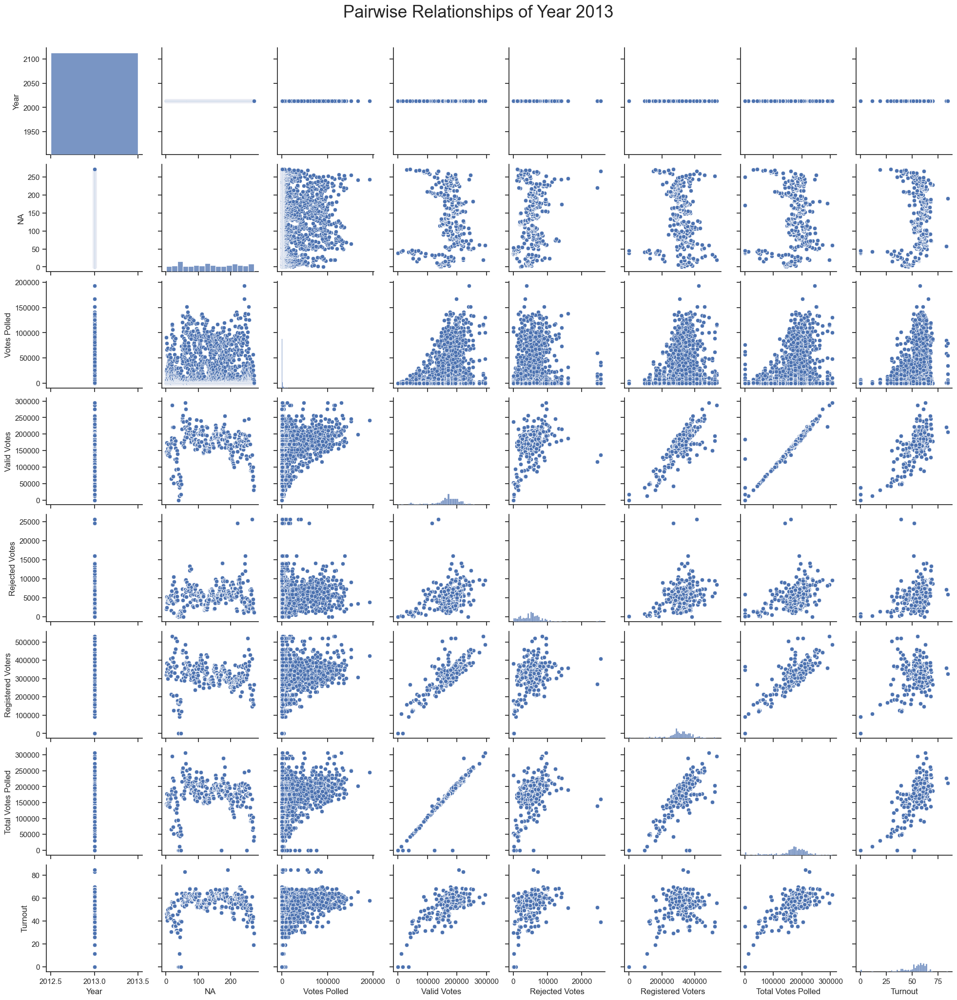

In [96]:
ax = plt.figure(dpi=200,figsize=(30,30));
sns.set(style="ticks", color_codes=True)

ax = sns.pairplot(Year2013);
ax.fig.suptitle("Pairwise Relationships of Year 2013", y=1.03, fontsize=25);


* **Number of parties reahed in Assembly in 2013**

In [97]:
number_of_parties_in_assembly_2013 = len(number_of_seats_per_party_2013)
number_of_parties_in_assembly_2013

20

### YEAR 2018

In [98]:
Year2018=df.loc[df['Year'] == 2018]
Year2018.head()

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
16112,2018,1,KPK,Moulana Abdul Akbar Chitrali,48616,158925,5430,269579,164355,60.97,Muttahida Majlis-e-Amal Pakistan
16113,2018,1,KPK,Saeed ur Rehman,3223,158925,5430,0,0,60.97,Pakistan Rah-e-Haq Party
16114,2018,1,KPK,Muhammad Yahya,698,158925,5430,0,0,60.97,Independent
16115,2018,1,KPK,Shahzada Muhammad Taimur Khisrao,2414,158925,5430,0,0,60.97,Independent
16116,2018,1,KPK,Eid Ul Hussain,3613,158925,5430,0,0,60.97,Awami National Party


In [99]:
Province2018 = Year2018.groupby(['Province', 'Turnout'])
Province2018.first()

Year   NA                  Candidate Names  Votes Polled   
Province    Turnout                                                             
Balochistan 20.58    2018  268                  Muhammad Hashim         14435  \
            34.30    2018  266               Agha Hassan Baloch         20034   
            36.79    2018  265                 Qasim Khan Soori         25973   
            38.89    2018  261         Mir Khan Muhammad Jamali         45222   
            39.14    2018  260             Khalid Hussain Magsi         53330   
...                   ...  ...                              ...           ...   
Sindh       59.90    2018  194    SARDAR NASRULLAH KHAN DRESHAK         73225   
            61.96    2018  220     Nawab Muhammad Yousuf Talpur        162979   
            63.52    2018  195  Sardar Riaz Mehmood Khan Mazari         89796   
            68.68    2018  221   Pir Noor Muhammad Shah Jeelani         79098   
            70.91    2018  222              Mahesh Kumar Malani        106630   

                     Valid Votes  Rejected Votes  Registered Voters   
Province    Turnout                                                   
Balochistan 20.58          46217            2007             234291  \
            34.30          61541            2779             187539   
            36.79         114731            3422             321117   
            38.89         110593           10255             310782   
            39.14         129617           13597             365862   
...                          ...             ...                ...   
Sindh       59.90         173585            7435             302211   
            61.96         274686           11473             461867   
            63.52         167541            7350             275326   
            68.68         157186            9341             242458   
            70.91         222577           12763             331872   

                     Total Votes Polled   
Province    Turnout                       
Balochistan 20.58                 48224  \
            34.30                 64320   
            36.79                118153   
            38.89                120848   
            39.14                143214   
...                                 ...   
Sindh       59.90                181020   
            61.96                286159   
            63.52                174891   
            68.68                166527   
            70.91                235340   

                                                       Party  
Province    Turnout                                           
Balochistan 20.58                 Balochistan National Party  
            34.30                 Balochistan National Party  
            36.79                   Pakistan Tehreek-e-Insaf  
            38.89                   Pakistan Tehreek-e-Insaf  
            39.14                    Balochistan Awami Party  
...                                                      ...  
Sindh       59.90                   Pakistan Tehreek-e-Insaf  
            61.96    Pakistan Peoples Party Parliamentarians  
            63.52                   Pakistan Tehreek-e-Insaf  
            68.68    Pakistan Peoples Party Parliamentarians  
            70.91    Pakistan Peoples Party Parliamentarians  

[265 rows x 9 columns]

In [100]:
Year2018.groupby('Year')['Turnout'].mean()

Year
2018    48.910093
Name: Turnout, dtype: float64

In [101]:
print(Year2018)

       Year   NA     Province                   Candidate Names  Votes Polled   
16112  2018    1          KPK      Moulana Abdul Akbar Chitrali         48616  \
16113  2018    1          KPK                   Saeed ur Rehman          3223   
16114  2018    1          KPK                    Muhammad Yahya           698   
16115  2018    1          KPK  Shahzada Muhammad Taimur Khisrao          2414   
16116  2018    1          KPK                    Eid Ul Hussain          3613   
...     ...  ...          ...                               ...           ...   
19535  2018  272  Balochistan                    Mohammad Akram           882   
19536  2018  272  Balochistan            Muhammad Akhtar mengal         41866   
19537  2018  272  Balochistan                Nawab Khan Bizenjo           162   
19538  2018  272  Balochistan                     Shakeel Ahmed           338   
19539  2018  272  Balochistan               Wazeer Ahmed Norani          4604   

       Valid Votes  Rejecte

In [102]:
Year2018.groupby("Province").size()

Province
Balochistan     290
KPK             667
Punjab         1599
Sindh           872
dtype: int64

In [103]:
Year2018.groupby("NA").size()

NA
1      11
2      10
3       8
4      11
5      10
       ..
268    22
269    13
270    16
271    15
272    13
Length: 270, dtype: int64

In [104]:
groupedParty = Year2018.groupby("Party")
groupedParty.get_group('Pakistan Tehreek-e-Insaf')
groupedPTI2018 = groupedParty.get_group('Pakistan Tehreek-e-Insaf')
print(groupedPTI2018)

       Year   NA     Province              Candidate Names  Votes Polled   
16119  2018    1          KPK                  Abdul Latif         38481  \
16123  2018    2          KPK              Haider Ali Khan         61687   
16133  2018    3          KPK                Saleem Rehman         68162   
16141  2018    4          KPK                  Murad Saeed         71600   
16152  2018    5          KPK       SAHIBZADA SIBGHATULLAH         66545   
...     ...  ...          ...                          ...           ...   
19437  2018  266  Balochistan  Zain ul Abideen Khan Khilji          5622   
19444  2018  267  Balochistan            Meer Taj Muhammad          3557   
19478  2018  268  Balochistan            Sardar Aurangzaib          1540   
19484  2018  269  Balochistan              Shafiq U Rehman           833   
19528  2018  272  Balochistan                    Ali Ahmed          1592   

       Valid Votes  Rejected Votes  Registered Voters  Total Votes Polled   
16119     

* **Get list of parties participate in 2018 election**

In [105]:
list_of_parties_2018 = Year2018.Party.unique()
total_parties_in_2018 = len(list_of_parties_2018)
print(total_parties_in_2018)

86


* **Total Number of seats**

In [106]:
seats_list_in_2018 = Year2018.NA.unique()
total_na_seats_in_2018 = len(seats_list_in_2018)
print(total_na_seats_in_2018)

270


In [107]:
#Get list of candidates per NA seat
#list_of_candidates_per_na_2018 = Year2018.groupby('NA').size().reset_index(name='candidates')

#sorted_idx = (list_of_candidates_per_na_2013.assign(NA=list_of_candidates_per_na_2013.NA.astype(int))
 #        .sort_values(['NA'])
  #       .index)
#list_of_candidates_per_na_2013 = list_of_candidates_per_na_2013.iloc[sorted_idx]

#x = list_of_candidates_per_na_2018.NA
#y = list_of_candidates_per_na_2018.candidates

#fig = go.Figure()
#fig.add_trace(go.Scatter(x=x, y=y,
 #                   mode='lines+markers',
  #                  name='lines+markers'))

#fig.show()

In [108]:
from plotly.offline import iplot
data = [go.Bar(
    x=Year2018['Candidate Names'].unique(),
    y=Year2018.groupby(['Turnout'])['Candidate Names'].count(),
    textposition = 'auto',
    marker=dict(
        color=['rgba(204,204,204,1)', 'rgba(204,204,204,1)',
               'rgba(222,45,38,0.8)', 'rgba(204,204,204,1)'],
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5),
            ),
            opacity=0.6
    )]
layout = {
  'xaxis': {'title': 'Candidates'},
  'yaxis': {'title': 'No. of Participants'},
  'barmode': 'relative',
  'title': 'Total Number of Candidates Appeared'
};
iplot({'data': data, 'layout': layout})

* **List of candidates per party**

In [109]:
list_of_candidates_per_party_2018 = Year2018.groupby(['Party']).size().reset_index(name='candidates').sort_values('candidates', ascending=False)

fig = px.funnel(list_of_candidates_per_party_2018, x='Party', y='candidates', height=700, title='List of candidates per party')
fig.show()

<h3 style="text-align: center;"> **Number of votes per party </h3>
<h3 style="text-align: center;"> & no of seats by party for Year 2018** </h3>

In [110]:
list_of_votes_per_party_2018 = Year2018.groupby(['Party'])['Votes Polled'].sum().reset_index(name='total_votes').sort_values('total_votes', ascending=False)

fig = px.pie(list_of_votes_per_party_2018, names='Party', values='total_votes', title='Number of votes per party')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

max_votes_index_2018 = Year2018.groupby(['NA'])['Votes Polled'].idxmax()
number_of_seats_per_party_2018 = Year2018.loc[max_votes_index_2018].groupby(['Party']).size().reset_index(name='Seats').sort_values('Seats', ascending=False)

fig = px.pie(number_of_seats_per_party_2018, names='Party', values='Seats', title='Number of seats per Party')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()


* **Pairwise Relationships of Year 2018**

In [111]:
#sns.pairplot(groupedPTI2018)

<Figure size 6000x6000 with 0 Axes>

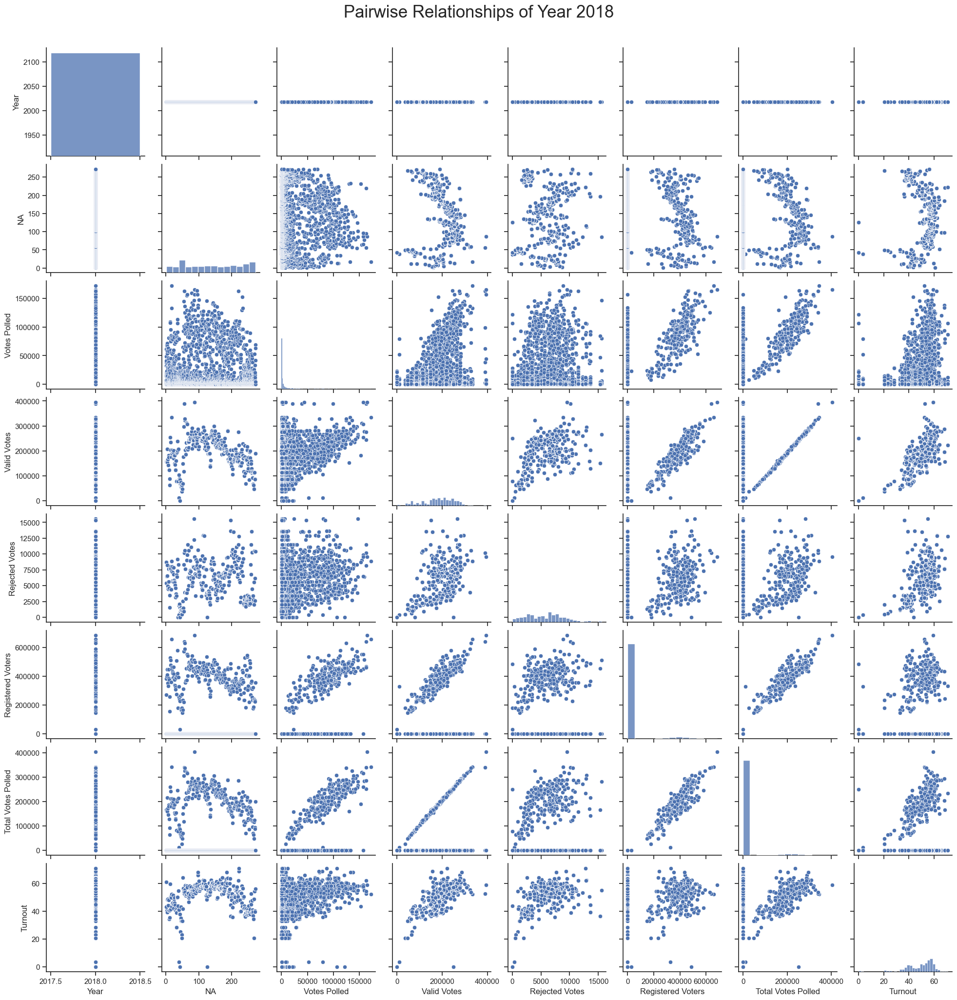

In [112]:
ax = plt.figure(dpi=200,figsize=(30,30));
sns.set(style="ticks", color_codes=True)

ax = sns.pairplot(Year2018);
ax.fig.suptitle("Pairwise Relationships of Year 2018", y=1.03, fontsize=25);


* **Number of parties reahed in Assembly in 2018**

In [113]:
number_of_parties_in_assembly_2018 = len(number_of_seats_per_party_2018)
number_of_parties_in_assembly_2018

13

In [114]:
#Year2008.hist(figsize=(15, 10), bins=50);
#Year2013.hist(figsize=(15, 10), bins=50);
#Year2018.hist(figsize=(15, 10), bins=50);

In [115]:
#ax = sns.histplot(Year2008);
#ax = sns.histplot(Year2013);
#ax = sns.histplot(Year2018);

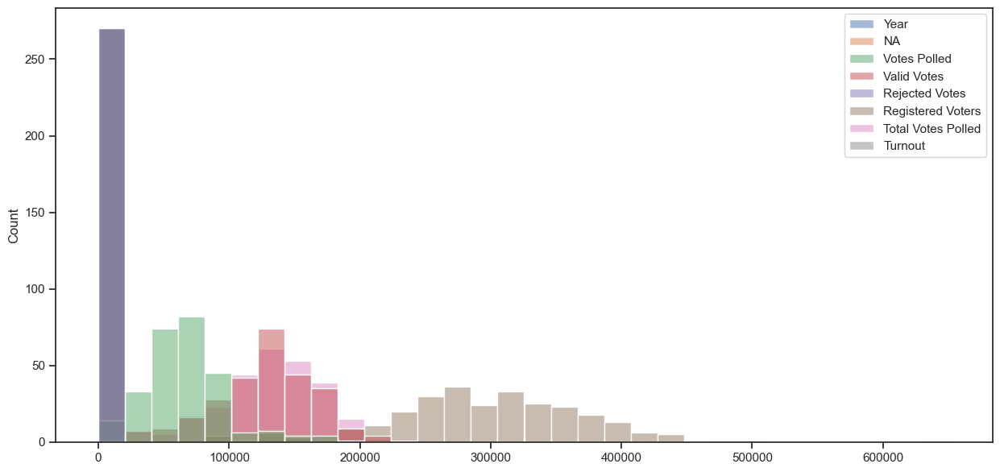

In [116]:
ax = sns.histplot(Year2008);

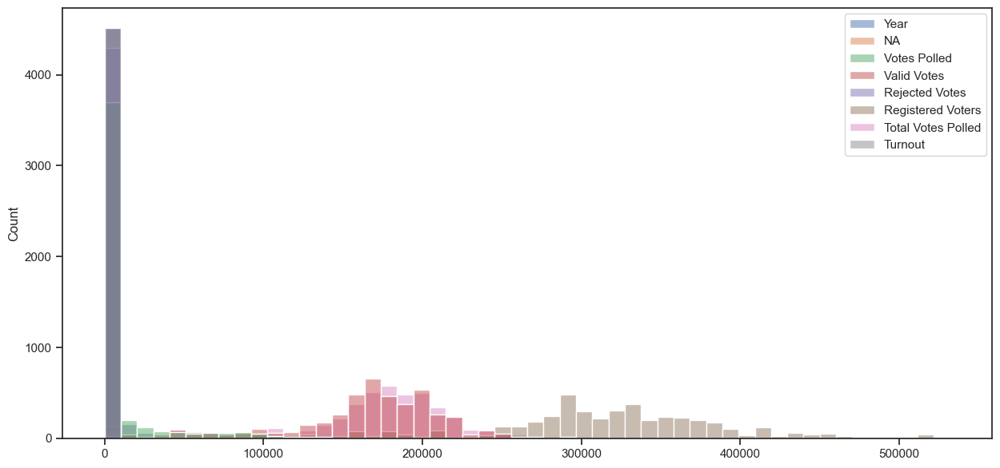

In [117]:
ax = sns.histplot(Year2013);

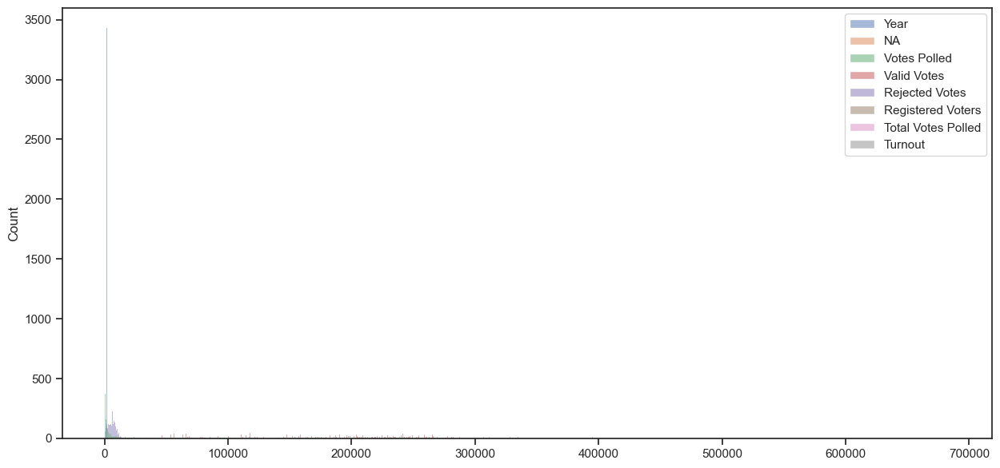

In [118]:
ax = sns.histplot(Year2018);

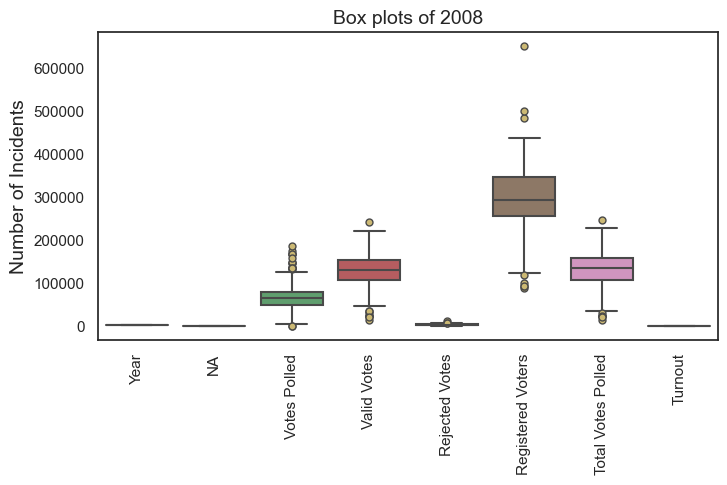

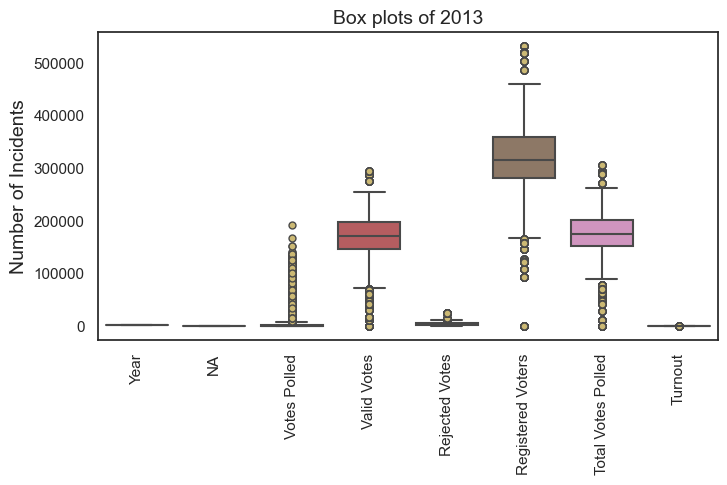

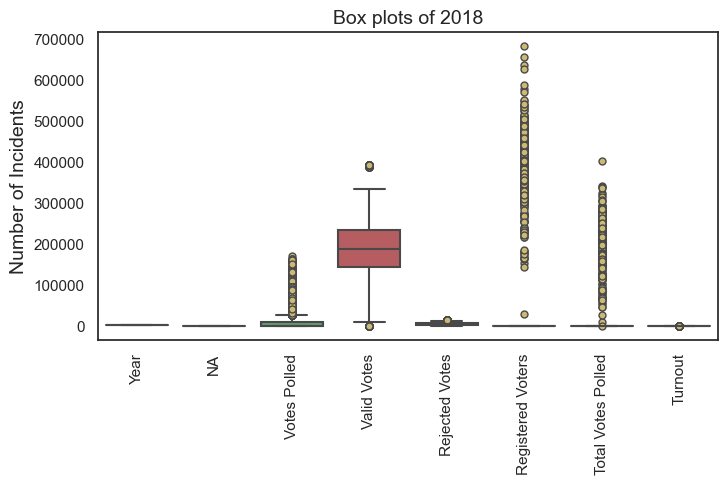

In [119]:
# additional check ! 
sns.set(style="white")

fig = plt.figure(figsize=(8,4), dpi=100)

sns.boxplot(Year2008,
           flierprops={"marker": "o", 'markerfacecolor': 'y'})

plt.xticks(rotation=90);
plt.ylabel('Number of Incidents', fontsize=14);
plt.title('Box plots of 2008', fontsize=14);

# additional check ! 
sns.set(style="white")

fig = plt.figure(figsize=(8,4), dpi=100)

sns.boxplot(Year2013,
           flierprops={"marker": "o", 'markerfacecolor': 'y'})

plt.xticks(rotation=90);
plt.ylabel('Number of Incidents', fontsize=14);
plt.title('Box plots of 2013', fontsize=14);

# additional check ! 
sns.set(style="white")

fig = plt.figure(figsize=(8,4), dpi=100)

sns.boxplot(Year2018,
           flierprops={"marker": "o", 'markerfacecolor': 'y'})

plt.xticks(rotation=90);
plt.ylabel('Number of Incidents', fontsize=14);
plt.title('Box plots of 2018', fontsize=14);

In [120]:
#Winner = (Year2018.groupby(['Party'])['Party'].count())
#Winner = Winner.sort_values(ascending=False)
#plt.figure(figsize=(15,10))
#plt.title('Elections 2018')
#Winner[0:5].plot(kind='bar',fontsize=15) # Display only Top 5
#plt.rc('axes',labelsize=0)
#plt.rc('axes',titlesize=20) 
#plt.grid(True)
#plt.show()

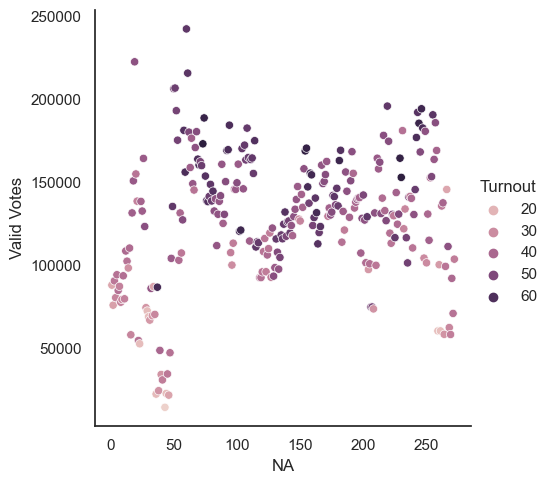

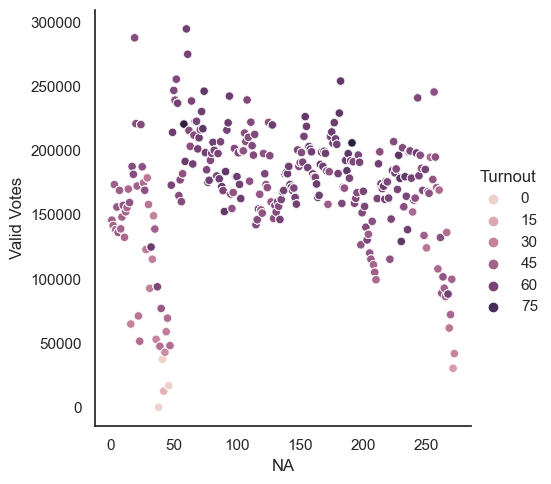

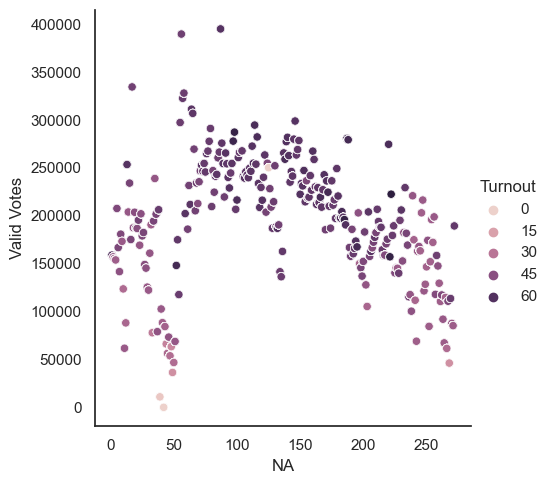

In [121]:
sns.relplot(x='NA',y='Valid Votes',hue='Turnout',data=Year2008)
sns.relplot(x='NA',y='Valid Votes',hue='Turnout',data=Year2013)
sns.relplot(x='NA',y='Valid Votes',hue='Turnout',data=Year2018)

In [122]:
#sns.relplot(x='NA',y='Valid Votes',hue='Party',data=Year2018)

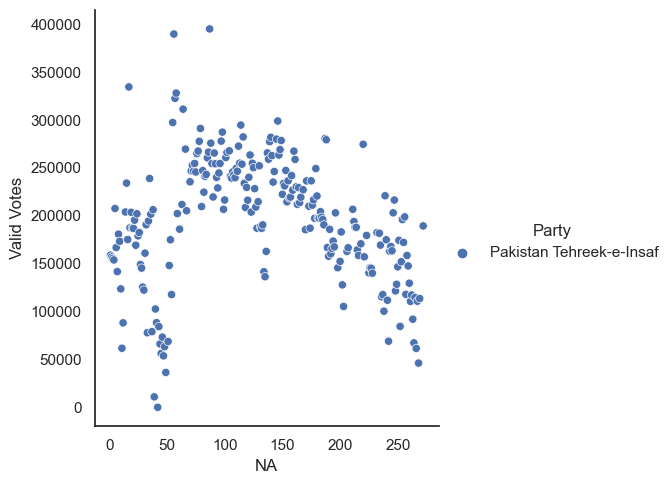

In [123]:
#groupedPTI2018
sns.relplot(x='NA',y='Valid Votes',hue='Party',data=groupedPTI2018)

In [124]:
#sns.relplot(x='NA',y='Valid Votes',hue='Candidate Names',data=Year2018)

<AxesSubplot: xlabel='NA', ylabel='Density'>

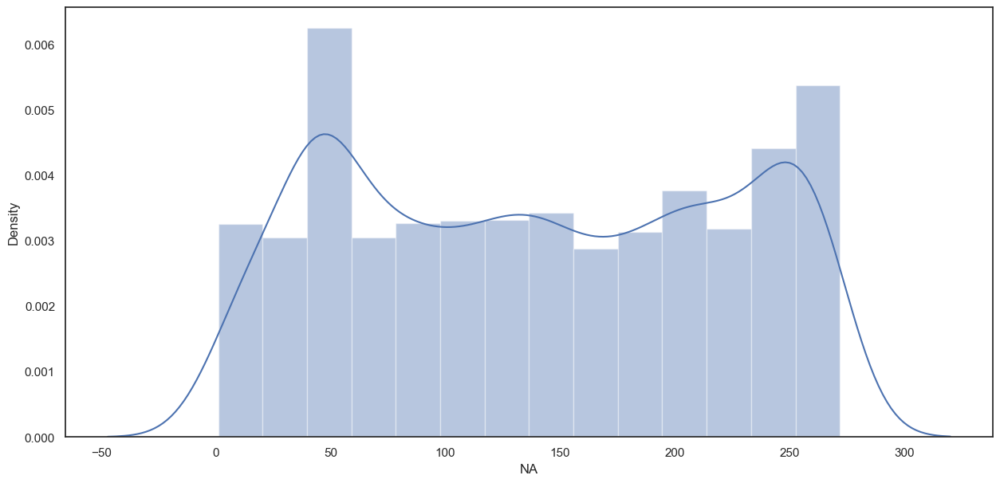

In [125]:
sns.distplot(Year2018['NA'])

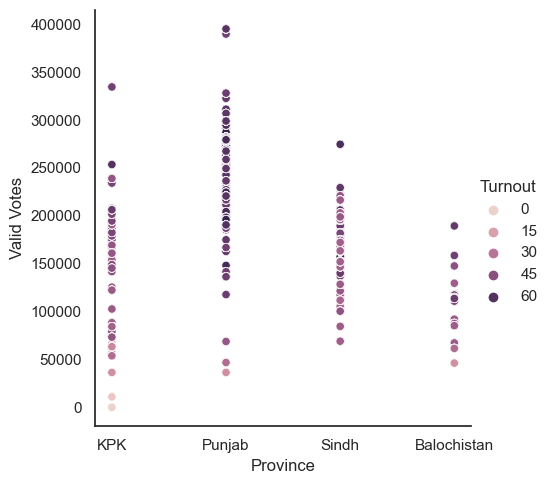

In [126]:
#sns.relplot(x='Candidate Names',y='Valid Votes',hue='Turnout',data=Year2018)
sns.relplot(x='Province',y='Valid Votes',hue='Turnout',data=Year2018)

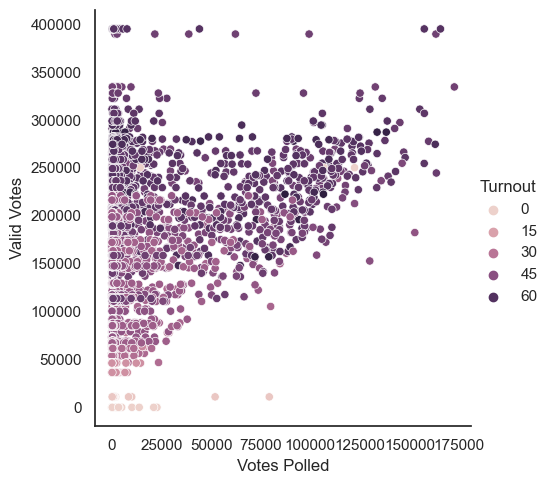

In [127]:
sns.relplot(x='Votes Polled',y='Valid Votes',hue='Turnout',data=Year2018)

In [128]:
#df.dtypes
#Year2018.duplicated().sum()

In [129]:
df1.columns

Index(['index', 'Year', 'NA', 'final_alpha_District', 'division', 'Prov',
       'zones_20', 'Regions_12', 'CandidateName', 'Votes', 'ValidVotes',
       'RejectedVotes', 'Regd_Voters', 'Total_Votes', 'Turnout', 'turnout_n',
       'Party', 'Merge_Party', 'Six_parties'],
      dtype='object')

In [130]:
df1['NA']=df1['NA'].apply(pd.to_numeric).astype('Int64')
df1['Year']=df1['Year'].apply(pd.to_numeric).astype('Int64')
df1['Votes']=df1['Votes'].apply(pd.to_numeric).astype('Int64')
df1 =df1.dropna(how='all')
df1["Rank"] = df1.groupby(["Year","NA"])["Votes"].rank(ascending= False).astype('Int64')
df.head(2)

,Year,NA,Province,Candidate Names,Votes Polled,Valid Votes,Rejected Votes,Registered Voters,Total Votes Polled,Turnout,Party
0,1970,1,KPK,Khan Abdul Qayoom Khan,27215,91040,1388,148708,92428,62.154020,PML-Q
6,1970,2,KPK,Ghulam Farooq,34402,85110,2010,154237,87120,56.484501,NAP-W


In [131]:
df1.head(2)

,index,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,ValidVotes,RejectedVotes,Regd_Voters,Total_Votes,Turnout,turnout_n,Party,Merge_Party,Six_parties,Rank
0,0,1970,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Khan Abdul Qayoom Khan,27215,91040.0,1388.0,148708.0,92428.0,62.0,62.15401996,PML-Q,Pakistan Muslim League(Qayyum Group),PML (s)/IJI/PNA,1
1,1,1970,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Hayat Khan Sherpao,23981,NaN,NaN,NaN,NaN,NaN,,PPP,PPP,PPP (s)/PDA,2


In [132]:
bins = [100000, 200000, 400000, 500000]
names = ['<=100K', '100K-200K', '200K-400K', "400K-500K", '500K+']
d = dict(enumerate(names, 0))
df1['Size'] = np.vectorize(d.get)(np.digitize(df1['Regd_Voters'], bins))
df1.head(1)

,index,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,...,RejectedVotes,Regd_Voters,Total_Votes,Turnout,turnout_n,Party,Merge_Party,Six_parties,Rank,Size
0,0,1970,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Khan Abdul Qayoom Khan,27215,...,1388.0,148708.0,92428.0,62.0,62.15401996,PML-Q,Pakistan Muslim League(Qayyum Group),PML (s)/IJI/PNA,1,100K-200K


In [133]:
#df1['Size'].unique()
names = {'<=100K':"1", '100K-200K':"2", '200K-400K':"3", "400K-500K":"4", '500K+':"5"}
df1['NA_Size']=df1['Size'].map(names)
df1['NA_Size']=df1['NA_Size'].astype(str).astype(int)
df1['NA_Size'].unique()

array([2, 5, 1, 3, 4])

In [134]:
#df1.info()
df1=df1.sort_values(['index','Year', 'NA','ValidVotes','Votes'], ascending=[True, True, True, False, False])
df1['Winner Party']=df1['Six_parties']
df1['Runner Party']=df1['Six_parties'].shift(-1)
df1['Winners Votes']=df1['Votes']
df1['Runner Votes']=df1['Votes'].shift(-1)
df1['Winner_Margin']=df1['Winners Votes']-df1['Runner Votes']

In [135]:
df1=df1.sort_values(['index','Year', 'NA','ValidVotes','Votes'], ascending=[True, True, True, False, False])
df1['Winner Party1']=df1['Merge_Party']
df1['Runner Party1']=df1['Merge_Party'].shift(-1)
df1['Runner Party2']=df1['Merge_Party'].shift(-2)

In [136]:
df1_na=df1.copy()
df1_na=df1_na[(df1_na['Year']==2018)]
df1_na=df1_na[(df1_na['ValidVotes']>=0)]
df1_na['Percentage of Rejected Votes']=(df1_na['RejectedVotes']/df1['Total_Votes'])*100
col = {'Punjab':'green','Sindh':'blue','KPK': 'red','Balochistan':'yellow'}
df1_na['col']=df1_na['Prov'].map(col)
df1_na.head(2)

,index,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,...,Winner Party,Runner Party,Winners Votes,Runner Votes,Winner_Margin,Winner Party1,Runner Party1,Runner Party2,Percentage of Rejected Votes,col
16057,16057,2018,1,Chitral,Malakand Division,KPK,Zone-1 (North) Malakand Division,KPK North,,48616,...,Religious Parties,PTI,48616,38481,10135,Others,PTI,PPP,3.303824,red
16068,16068,2018,2,Swat,Malakand Division,KPK,Zone-1 (North) Malakand Division,KPK North,,61687,...,PTI,PML (s)/IJI/PNA,61687,41125,20562,PTI,PML,Others,5.260555,red


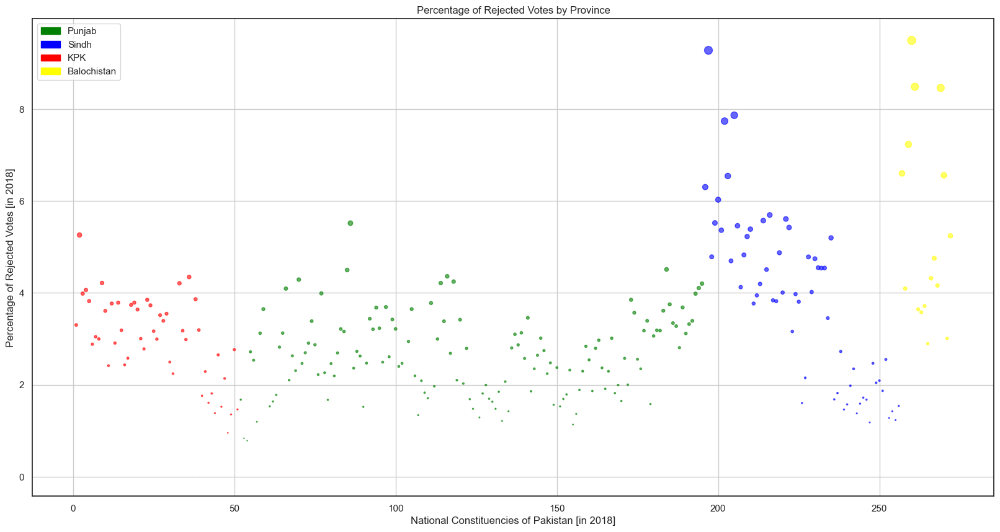

In [137]:
# Specify figure size
plt.figure(figsize=(20,10))
df1_na['Size']=df1_na['Percentage of Rejected Votes']*df1_na['Percentage of Rejected Votes']
# Previous customization
plt.scatter(df1_na['NA'],df1_na['Percentage of Rejected Votes'], s=df1_na['Size'], c=df1_na['col'], alpha=0.6)
plt.xlabel('National Constituencies of Pakistan [in 2018]')
plt.ylabel('Percentage of Rejected Votes [in 2018]')
plt.title('Percentage of Rejected Votes by Province')
plt.grid(True)
fig = plt.gcf()

# Legend
blue_patch = mpatches.Patch(color='blue', label='Sindh')
yellow_patch = mpatches.Patch(color='yellow', label='Balochistan')
red_patch = mpatches.Patch(color='red', label='KPK')
green_patch = mpatches.Patch(color='green', label='Punjab')
plt.legend(handles=[green_patch,blue_patch, red_patch, yellow_patch])

# Save the plot
#plt.savefig('D:\Tahmina\Desktop\Rejected Votes in 2018.png')
# Show plot
plt.show()

In [138]:
col = {'PML (s)/IJI/PNA':'green','PPP (s)/PDA':'black','Province Parties':'blue', 'Religious Parties':'yellow',
        'Independent Parties':'pink','PTI':'red','Other Parties':'orange'}
df1_na['col']=df1_na['Six_parties'].map(col)
df1_na['col'].unique()

array(['yellow', 'red', 'green', 'pink', 'blue', 'orange', 'black'],
      dtype=object)

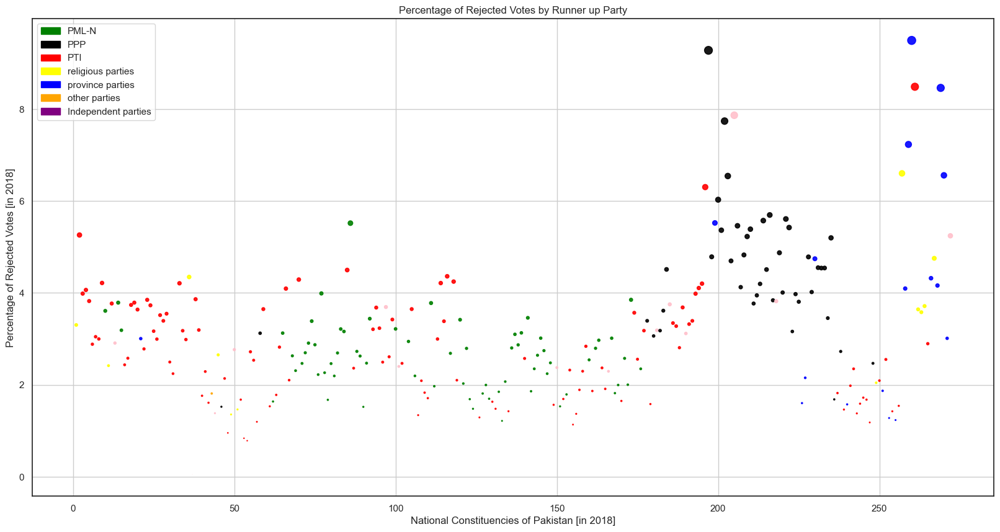

In [139]:
# Specify figure size
plt.figure(figsize=(20,10))
df1_na['Size']=df1_na['Percentage of Rejected Votes']*df1_na['Percentage of Rejected Votes']
# Previous customization
plt.scatter(df1_na['NA'],df1_na['Percentage of Rejected Votes'], s=df1_na['Size'], c=df1_na['col'], alpha=0.9)
plt.xlabel('National Constituencies of Pakistan [in 2018]')
plt.ylabel('Percentage of Rejected Votes [in 2018]')
plt.title('Percentage of Rejected Votes by Runner up Party')
plt.grid(True)
fig = plt.gcf()

# Legend
green_patch = mpatches.Patch(color='green', label='PML-N')
black_patch = mpatches.Patch(color='black', label='PPP')
red_patch = mpatches.Patch(color='red', label='PTI')
yellow_patch = mpatches.Patch(color='yellow', label='religious parties')
blue_patch = mpatches.Patch(color='blue', label='province parties')
orange_patch = mpatches.Patch(color='orange', label='other parties')
purple_patch = mpatches.Patch(color='purple', label='Independent parties')
plt.legend(handles=[green_patch,black_patch, red_patch, yellow_patch, blue_patch, orange_patch, purple_patch])

# Save the plot
#plt.savefig('D:\Tahmina\Desktop\Rejected Votes in 2018.png')
# Show plot
plt.show()

In [140]:
col = {'PML (s)/IJI/PNA':'green','PPP (s)/PDA':'black','Province Parties':'blue', 'Religious Parties':'yellow',
        'Independent Parties':'pink','PTI':'red','Other Parties':'orange'}
df1_na['col']=df1_na['Runner Party'].map(col)
df1_na['col'].unique()

array(['red', 'green', 'blue', 'yellow', 'black', 'pink', 'orange'],
      dtype=object)

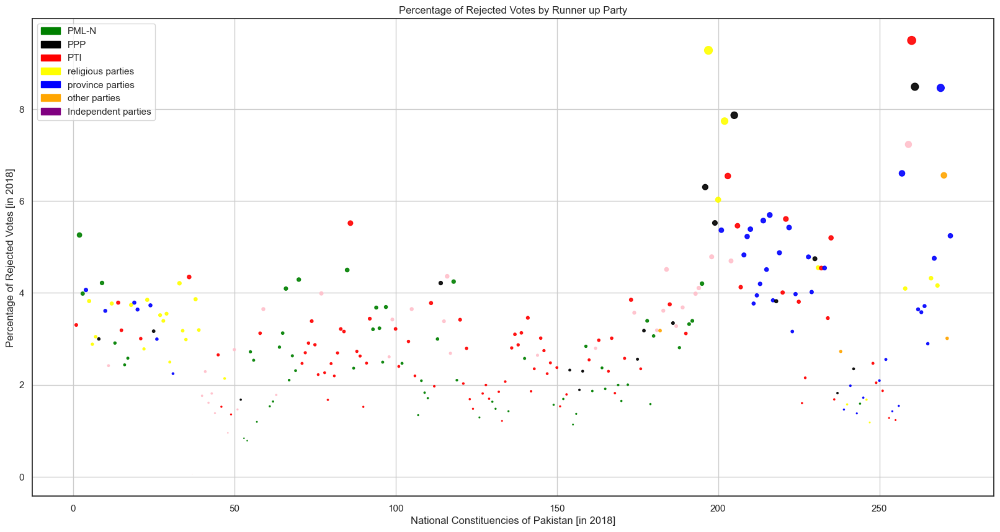

In [141]:
# Specify figure size
plt.figure(figsize=(20,10))
df1_na['Size']=df1_na['Percentage of Rejected Votes']*df1_na['Percentage of Rejected Votes']
# Previous customization
plt.scatter(df1_na['NA'],df1_na['Percentage of Rejected Votes'], s=df1_na['Size'], c=df1_na['col'], alpha=0.9)
plt.xlabel('National Constituencies of Pakistan [in 2018]')
plt.ylabel('Percentage of Rejected Votes [in 2018]')
plt.title('Percentage of Rejected Votes by Runner up Party')
plt.grid(True)
fig = plt.gcf()

# Legend
green_patch = mpatches.Patch(color='green', label='PML-N')
black_patch = mpatches.Patch(color='black', label='PPP')
red_patch = mpatches.Patch(color='red', label='PTI')
yellow_patch = mpatches.Patch(color='yellow', label='religious parties')
blue_patch = mpatches.Patch(color='blue', label='province parties')
orange_patch = mpatches.Patch(color='orange', label='other parties')
purple_patch = mpatches.Patch(color='purple', label='Independent parties')
plt.legend(handles=[green_patch,black_patch, red_patch, yellow_patch, blue_patch, orange_patch, purple_patch])

# Save the plot
#plt.savefig('D:\Tahmina\Desktop\Rejected Votes in 2018.png')
# Show plot
plt.show()

In [142]:
#df1_na.columns
df1=df1[(df1['Year']>=2002) & (df1['Year']<=2013)]

In [143]:
df2=df1.copy()
df1=df1[(df1['ValidVotes']>=0)]
df1['Year'].unique()

<IntegerArray>
[2002, 2008, 2013]
Length: 3, dtype: Int64

In [144]:
df1['NA1']=df1['NA'].copy()
df1['NA1'] = df1['NA1'].apply(str)
df1['Id'] = df1[['NA1','Merge_Party']].agg('-'.join, axis=1)
df1 = df1.set_index('Id')
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 813 entries, 1-Others to 272-Others
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   index                 813 non-null    int64  
 1   Year                  813 non-null    Int64  
 2   NA                    813 non-null    Int64  
 3   final_alpha_District  813 non-null    object 
 4   division              813 non-null    object 
 5   Prov                  813 non-null    object 
 6   zones_20              813 non-null    object 
 7   Regions_12            813 non-null    object 
 8   CandidateName         813 non-null    object 
 9   Votes                 813 non-null    Int64  
 10  ValidVotes            813 non-null    float64
 11  RejectedVotes         813 non-null    float64
 12  Regd_Voters           813 non-null    float64
 13  Total_Votes           813 non-null    float64
 14  Turnout               542 non-null    float64
 15  turnout_n     

In [145]:
df1_win=df2.loc[(df2['Rank'] == 1) & (df2['Votes'] >= 0)]
df1_win.head(1)

,index,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,...,Size,NA_Size,Winner Party,Runner Party,Winners Votes,Runner Votes,Winner_Margin,Winner Party1,Runner Party1,Runner Party2
7330,7330,2002,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Mr.Shabir Ahmad,37179,...,200K-400K,3,Religious Parties,Province Parties,37179,23002,14177,Others,Others,PTI


## Create table using column parameter

In [146]:
# Create table using column parameter
p_table = pd.pivot_table(df1, index= ['NA','Merge_Party','Id'], values=['index'], aggfunc = 'count' ).reset_index()
p_table =p_table.drop_duplicates(subset='Id', keep="first")
p_table = p_table.set_index('Id')
p_table.drop("Merge_Party", axis=1, inplace=True)
p_table.drop("NA", axis=1, inplace=True)
p_table.rename(columns={'index': 'Number of times won'}, inplace=True, errors='raise')
p_table

,Number of times won
Id,
1-Others,3
2-Others,1
2-PPP,1
2-PTI,1
3-Others,1
...,...
270-Others,3
271-Others,2
271-PML,1


In [147]:
na_c.head(2)

,2018 Seat Number,Seat Name,2013 Seat Number,NA_2018,NA_2013
0,NA-027,Peshawar I,NA-001,27.0,1.0
1,NA-028,Peshawar II,NA-002,28.0,2.0


In [148]:
na_c['NA_2018'] = na_c['NA_2018'].apply(pd.to_numeric).astype('Int64')
na_c['NA_2013'] = na_c['NA_2013'].apply(pd.to_numeric).astype('Int64')
na_c.rename(columns={'NA_2018': 'NA','NA_2013': 'NA1'}, inplace=True, errors='raise')
na_c= na_c.sort_values(by=['NA'], ascending=True)
na_c.info()

<class 'pandas.core.frame.DataFrame'>
Index: 288 entries, 31 to 267
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   2018 Seat Number  288 non-null    object
 1   Seat Name         288 non-null    object
 2   2013 Seat Number  288 non-null    object
 3   NA                272 non-null    Int64 
 4   NA1               273 non-null    Int64 
dtypes: Int64(2), object(3)
memory usage: 14.1+ KB


In [149]:
df1_na['NA'] = df1_na['NA'].apply(pd.to_numeric).astype('Int64')

In [150]:
import pandas as pd
from functools import reduce
# compile the list of dataframes you want to merge
data_frames = [df1_na, na_c]
df1_na = reduce(lambda  left,right: pd.merge(left,right,on=['NA'],
                                            how='outer'), data_frames)
df1_na.head(1)

,index,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,...,Winner_Margin,Winner Party1,Runner Party1,Runner Party2,Percentage of Rejected Votes,col,2018 Seat Number,Seat Name,2013 Seat Number,NA1
0,16057.0,2018,1,Chitral,Malakand Division,KPK,Zone-1 (North) Malakand Division,KPK North,,48616,...,10135,Others,PTI,PPP,3.303824,red,NA-001,Chitral,NA-032,32


In [151]:
df1_na.dropna(inplace=True)
#df1_na.info()

In [152]:
#df1_na.info()

In [153]:
df1_na['NA1'] = df1_na['NA1'].apply(str)
df1_na['Id'] = df1_na[['NA1','Merge_Party']].agg('-'.join, axis=1)
df1_na = df1_na.set_index('Id')
df1_na.info()

<class 'pandas.core.frame.DataFrame'>
Index: 253 entries, 32-Others to 272-Others
Data columns (total 36 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   index                         253 non-null    float64
 1   Year                          253 non-null    Int64  
 2   NA                            253 non-null    Int64  
 3   final_alpha_District          253 non-null    object 
 4   division                      253 non-null    object 
 5   Prov                          253 non-null    object 
 6   zones_20                      253 non-null    object 
 7   Regions_12                    253 non-null    object 
 8   CandidateName                 253 non-null    object 
 9   Votes                         253 non-null    Int64  
 10  ValidVotes                    253 non-null    float64
 11  RejectedVotes                 253 non-null    float64
 12  Regd_Voters                   253 non-null    float64


In [154]:
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na.head(1)

,index,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,...,Winner Party1,Runner Party1,Runner Party2,Percentage of Rejected Votes,col,2018 Seat Number,Seat Name,2013 Seat Number,NA1,Number of times won
Id,,,,,,,,,,,,,,,,,,,,,
32-Others,16057.0,2018,1,Chitral,Malakand Division,KPK,Zone-1 (North) Malakand Division,KPK North,,48616,...,Others,PTI,PPP,3.303824,red,NA-001,Chitral,NA-032,32,2.0


In [155]:
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
df1_na.shape

(253, 37)

In [156]:
df1_win=df2.loc[(df2['Rank'] == 1) & (df2['Votes'] >= 0)]
df1_win.head(1)


,index,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,...,Size,NA_Size,Winner Party,Runner Party,Winners Votes,Runner Votes,Winner_Margin,Winner Party1,Runner Party1,Runner Party2
7330,7330,2002,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Mr.Shabir Ahmad,37179,...,200K-400K,3,Religious Parties,Province Parties,37179,23002,14177,Others,Others,PTI


In [157]:
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
df1_na.head(2)


,index,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,...,Runner Party1,Runner Party2,Percentage of Rejected Votes,col,2018 Seat Number,Seat Name,2013 Seat Number,NA1,Number of times won_x,Number of times won_y
Id,,,,,,,,,,,,,,,,,,,,,
32-Others,16057.0,2018,1,Chitral,Malakand Division,KPK,Zone-1 (North) Malakand Division,KPK North,,48616,...,PTI,PPP,3.303824,red,NA-001,Chitral,NA-032,32,2.0,2.0
29-PTI,16068.0,2018,2,Swat,Malakand Division,KPK,Zone-1 (North) Malakand Division,KPK North,,61687,...,PML,Others,5.260555,green,NA-002,Swat I,NA-029,29,1.0,1.0


In [158]:
#df1['NA'] = pd.to_numeric(df1['NA'],errors = 'coerce')

In [159]:
# Create table using column parameter
p_table = pd.pivot_table(df1_win, index= ['NA','Merge_Party'], values=['Votes'], aggfunc = 'mean').reset_index()
p_table['NA'] = p_table['NA'].apply(str)
p_table['Id'] = p_table[['NA','Merge_Party']].agg('-'.join, axis=1)
p_table =p_table.drop_duplicates(subset='Id', keep="first")
p_table = p_table.set_index('Id')
p_table.drop("Merge_Party", axis=1, inplace=True)
p_table.drop("NA", axis=1, inplace=True)
p_table.rename(columns={'Votes': 'Average Vote Bank as winner'}, inplace=True, errors='raise')
p_table

,Average Vote Bank as winner
Id,
1-Others,38591.666667
2-Others,37728.0
2-PPP,34443.0
2-PTI,79125.0
3-Others,33567.0
...,...
270-Others,49096.666667
271-Others,24315.5
271-PML,7388.0


In [160]:
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")

In [161]:
df1_run=df2.loc[(df2['Rank'] == 2) & (df2['Votes'] >= 0)]
df1_run.head(1)

,index,Year,NA,final_alpha_District,division,Prov,zones_20,Regions_12,CandidateName,Votes,...,Size,NA_Size,Winner Party,Runner Party,Winners Votes,Runner Votes,Winner_Margin,Winner Party1,Runner Party1,Runner Party2
7331,7331,2002,1,Peshawar,Peshawar Division,KPK,Zone-3 (Peshawar Valley) Peshawar & Mardan Div...,Peshawar Valley,Mr.Usman Bashir Bilour,23002,...,500K+,5,Province Parties,Other Parties,23002,2029,20973,Others,PTI,Others


In [162]:
# Create table using column parameter
p_table = pd.pivot_table(df1_run, index= ['NA','Merge_Party'], values=['Votes'], aggfunc = 'mean' ).reset_index()
p_table['NA'] = p_table['NA'].apply(str)
p_table['Id'] = p_table[['NA','Merge_Party']].agg('-'.join, axis=1)
p_table =p_table.drop_duplicates(subset='Id', keep="first")
p_table = p_table.set_index('Id')
p_table.drop("Merge_Party", axis=1, inplace=True)
p_table.drop("NA", axis=1, inplace=True)
p_table.rename(columns={'Votes': 'Average Vote Bank as runner-up'}, inplace=True, errors='raise')
p_table

,Average Vote Bank as runner-up
Id,
1-Others,23002.0
1-PPP,37682.0
1-PTI,28911.0
2-Jamiat Ulema e Islam ( Fazl ur Rahman Group ),18787.0
2-Others,23992.0
...,...
271-Others,22175.0
271-PPP,6170.0
272-Balochistan National Movement,36169.0


In [163]:
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
#df1_na.head(2)

In [164]:
df1.columns

Index(['index', 'Year', 'NA', 'final_alpha_District', 'division', 'Prov',
       'zones_20', 'Regions_12', 'CandidateName', 'Votes', 'ValidVotes',
       'RejectedVotes', 'Regd_Voters', 'Total_Votes', 'Turnout', 'turnout_n',
       'Party', 'Merge_Party', 'Six_parties', 'Rank', 'Size', 'NA_Size',
       'Winner Party', 'Runner Party', 'Winners Votes', 'Runner Votes',
       'Winner_Margin', 'Winner Party1', 'Runner Party1', 'Runner Party2',
       'NA1'],
      dtype='object')

In [165]:
# Create table using column parameter
p_table = pd.pivot_table(df1, index= ['NA','Runner Party1','Id'], values=['index'], aggfunc = 'count' ).reset_index()
p_table =p_table.drop_duplicates(subset='Id', keep="first")
p_table = p_table.set_index('Id')
p_table.drop('Runner Party1', axis=1, inplace=True)
p_table.drop("NA", axis=1, inplace=True)
p_table.rename(columns={'index': 'Number of times won runner'}, inplace=True, errors='raise')
p_table

,Number of times won runner
Id,
1-Others,1
2-PTI,1
2-PPP,1
2-Others,1
3-PTI,1
...,...
270-Others,3
271-Others,1
271-PML,1


In [166]:
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
#df1_na.head(1)

In [167]:
# Create table using column parameter
p_table = pd.pivot_table(df1, index= ['NA','Runner Party2','Id'], values=['index'], aggfunc = 'count' ).reset_index()
p_table =p_table.drop_duplicates(subset='Id', keep="first")
p_table = p_table.set_index('Id')
p_table.drop('Runner Party2', axis=1, inplace=True)
p_table.drop("NA", axis=1, inplace=True)
p_table.rename(columns={'index': 'Number of times second runner'}, inplace=True, errors='raise')
p_table

,Number of times second runner
Id,
1-Others,1
2-PPP,1
2-PTI,1
2-Others,1
3-Others,1
...,...
270-Others,3
271-PML,1
271-Others,1


In [168]:
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
#df1_na.head(1)

In [169]:
# Create table using column parameter
p_table = pd.pivot_table(df1, index= ['NA','Merge_Party'], values=['Votes'], aggfunc = 'min' ).reset_index()
p_table['NA'] = p_table['NA'].apply(str)
p_table['Id'] = p_table[['NA','Merge_Party']].agg('-'.join, axis=1)
p_table =p_table.drop_duplicates(subset='Id', keep="first")
p_table = p_table.set_index('Id')
p_table.drop("Merge_Party", axis=1, inplace=True)
p_table.drop("NA", axis=1, inplace=True)
p_table.rename(columns={'Votes': 'Minimum Votes'}, inplace=True, errors='raise')
p_table
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
#df1_na.head(1)

In [170]:
# Create table using column parameter
p_table = pd.pivot_table(df1, index= ['NA','Merge_Party'], values=['Votes'], aggfunc = 'max' ).reset_index()
p_table['NA'] = p_table['NA'].apply(str)
p_table['Id'] = p_table[['NA','Merge_Party']].agg('-'.join, axis=1)
p_table =p_table.drop_duplicates(subset='Id', keep="first")
p_table = p_table.set_index('Id')
p_table.drop("Merge_Party", axis=1, inplace=True)
p_table.drop("NA", axis=1, inplace=True)
p_table.rename(columns={'Votes': 'Maximum Votes'}, inplace=True, errors='raise')
p_table
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
#df1_na.head(1)

In [171]:
# Create table using column parameter
p_table = pd.pivot_table(df1, index= ['NA','Merge_Party'], values=['Votes'], aggfunc = 'std' ).reset_index()
p_table['NA'] = p_table['NA'].apply(str)
p_table['Id'] = p_table[['NA','Merge_Party']].agg('-'.join, axis=1)
p_table =p_table.drop_duplicates(subset='Id', keep="first")
p_table = p_table.set_index('Id')
p_table.drop("Merge_Party", axis=1, inplace=True)
p_table.drop("NA", axis=1, inplace=True)
p_table.rename(columns={'Votes': 'Stander Deviation of Votes'}, inplace=True, errors='raise')
p_table
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
#df1_na.head(1)

In [172]:
# Create table using column parameter
p_table = pd.pivot_table(df1, index= ['NA','Merge_Party'], values=['Rank'], aggfunc = 'mean' ).reset_index()
p_table['NA'] = p_table['NA'].apply(str)
p_table['Id'] = p_table[['NA','Merge_Party']].agg('-'.join, axis=1)
p_table =p_table.drop_duplicates(subset='Id', keep="first")
p_table = p_table.set_index('Id')
p_table.drop("Merge_Party", axis=1, inplace=True)
p_table.drop("NA", axis=1, inplace=True)
p_table.rename(columns={'Rank': 'Average Rank in previous election'}, inplace=True, errors='raise')
p_table

,Average Rank in previous election
Id,
1-Others,1.0
2-Others,1.0
2-PPP,1.0
2-PTI,1.0
3-Others,1.0
...,...
270-Others,1.0
271-Others,1.0
271-PML,1.0


In [173]:
df1_na=pd.merge(df1_na, p_table, left_index=True, right_index=True, how='left')
df1_na=df1_na.fillna(0)
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
#df1_na.head(1)

In [174]:
df1_na.columns

Index(['index', 'Year', 'NA', 'final_alpha_District', 'division', 'Prov',
       'zones_20', 'Regions_12', 'CandidateName', 'Votes', 'ValidVotes',
       'RejectedVotes', 'Regd_Voters', 'Total_Votes', 'Turnout', 'turnout_n',
       'Party', 'Merge_Party', 'Six_parties', 'Rank', 'Size', 'NA_Size',
       'Winner Party', 'Runner Party', 'Winners Votes', 'Runner Votes',
       'Winner_Margin', 'Winner Party1', 'Runner Party1', 'Runner Party2',
       'Percentage of Rejected Votes', 'col', '2018 Seat Number', 'Seat Name',
       '2013 Seat Number', 'NA1', 'Number of times won_x',
       'Number of times won_y', 'Average Vote Bank as winner',
       'Average Vote Bank as runner-up', 'Number of times won runner',
       'Number of times second runner', 'Minimum Votes', 'Maximum Votes',
       'Stander Deviation of Votes', 'Average Rank in previous election'],
      dtype='object')

In [175]:
df1_na = df1_na.dropna()
df1_na = df1_na.reset_index()
df1_na =df1_na.drop_duplicates(subset='NA', keep="first")
df1_na=df1_na.sort_values(['NA', 'Id'], ascending=[True, True])
df1_na.to_csv("df1_na.csv")
df2.to_csv("df2.csv")
df1.to_csv("df1.csv")

In [176]:
df1_na.columns

Index(['Id', 'index', 'Year', 'NA', 'final_alpha_District', 'division', 'Prov',
       'zones_20', 'Regions_12', 'CandidateName', 'Votes', 'ValidVotes',
       'RejectedVotes', 'Regd_Voters', 'Total_Votes', 'Turnout', 'turnout_n',
       'Party', 'Merge_Party', 'Six_parties', 'Rank', 'Size', 'NA_Size',
       'Winner Party', 'Runner Party', 'Winners Votes', 'Runner Votes',
       'Winner_Margin', 'Winner Party1', 'Runner Party1', 'Runner Party2',
       'Percentage of Rejected Votes', 'col', '2018 Seat Number', 'Seat Name',
       '2013 Seat Number', 'NA1', 'Number of times won_x',
       'Number of times won_y', 'Average Vote Bank as winner',
       'Average Vote Bank as runner-up', 'Number of times won runner',
       'Number of times second runner', 'Minimum Votes', 'Maximum Votes',
       'Stander Deviation of Votes', 'Average Rank in previous election'],
      dtype='object')

In [177]:
drop_col=['Id', 'index', 'Year', 'final_alpha_District', 'division', 'zones_20','Regions_12', 'CandidateName', 'Total_Votes', 'turnout_n',
       'Party', 'Six_parties', 'Rank', 'Size', 'Runner Party', 'Winners Votes', 'Runner Votes',
       'Winner_Margin', 'Winner Party1', 'Runner Party1', 'Runner Party2',
       'Percentage of Rejected Votes', 'col', '2018 Seat Number', 'Seat Name',
       '2013 Seat Number', 'NA1','Winner Party']
df1_na= df1_na.drop(drop_col, axis=1)

In [178]:
df1_na = df1_na.set_index('NA')
df1_na.columns

Index(['Prov', 'Votes', 'ValidVotes', 'RejectedVotes', 'Regd_Voters',
       'Turnout', 'Merge_Party', 'NA_Size', 'Number of times won_x',
       'Number of times won_y', 'Average Vote Bank as winner',
       'Average Vote Bank as runner-up', 'Number of times won runner',
       'Number of times second runner', 'Minimum Votes', 'Maximum Votes',
       'Stander Deviation of Votes', 'Average Rank in previous election'],
      dtype='object')

In [179]:
# create dummy variables
df1_na = pd.get_dummies(df1_na,columns=['Prov'])
#df1_na.head()

In [180]:
#df1_na.drop("level_0", axis=1, inplace=True)
#df1 = df1.drop(['level_0'])
df1_na.columns

Index(['Votes', 'ValidVotes', 'RejectedVotes', 'Regd_Voters', 'Turnout',
       'Merge_Party', 'NA_Size', 'Number of times won_x',
       'Number of times won_y', 'Average Vote Bank as winner',
       'Average Vote Bank as runner-up', 'Number of times won runner',
       'Number of times second runner', 'Minimum Votes', 'Maximum Votes',
       'Stander Deviation of Votes', 'Average Rank in previous election',
       'Prov_Balochistan', 'Prov_KPK', 'Prov_Punjab', 'Prov_Sindh'],
      dtype='object')

In [181]:
df1_na.head()

,Votes,ValidVotes,RejectedVotes,Regd_Voters,Turnout,Merge_Party,NA_Size,Number of times won_x,Number of times won_y,Average Vote Bank as winner,...,Number of times won runner,Number of times second runner,Minimum Votes,Maximum Votes,Stander Deviation of Votes,Average Rank in previous election,Prov_Balochistan,Prov_KPK,Prov_Punjab,Prov_Sindh
NA,,,,,,,,,,,,,,,,,,,,,
1,48616,158925.0,5430.0,269579.0,60.97,Others,3.0,2.0,2.0,34704.0,...,2.0,2.0,33278,36130,2016.66854,1.0,False,True,False,False
2,61687,157060.0,8721.0,382974.0,43.29,PTI,3.0,1.0,1.0,88513.0,...,1.0,1.0,88513,88513,0.0,1.0,False,True,False,False
3,68162,155420.0,6452.0,401124.0,40.35,PTI,4.0,1.0,1.0,49976.0,...,1.0,1.0,49976,49976,0.0,1.0,False,True,False,False
5,66545,207664.0,8256.0,447414.0,48.26,PTI,4.0,0.0,0.0,0.0,...,0.0,0.0,0,0,0.0,0.0,False,True,False,False
6,63440,166820.0,4955.0,351245.0,48.90,PTI,3.0,0.0,0.0,0.0,...,0.0,0.0,0,0,0.0,0.0,False,True,False,False


In [182]:
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Pakistan Tehreek e Insaf","PTI")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace('Pakistan Muslim League (Nawaz Group) / IJI',"PML")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Pakistan Peoples Party/ Pakistan Democratic Allliance","PPP")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Independent","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Muttahidda Majlis-e-Amal","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Muttahida Qaumi Movement Pakistan","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Pakistan Muslim Leaugue Quaid e Azam","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Balochistan Awami Party","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Grand Democratic Alliance","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Awami National Party","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Pakistan Tehreek-e-Insaniat","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Awami Muslim League Pakistan","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Jamhori Wattan Party","Others")
df1_na['Merge_Party'] =df1_na['Merge_Party'].str.replace("Balochistan National Party","Others")
df1_na['Merge_Party'].value_counts()

Merge_Party
PTI       104
PML        62
Others     46
PPP        41
Name: count, dtype: int64

In [183]:
#X = df_na[['Regd_Voters','Percentage of Rejected Votes',"Turnout",'Votes',"ValidVotes",'RejectedVotes','Regd_Voters','Number of times won']]
X = df1_na.drop('Merge_Party', axis=1)
y = df1_na['Merge_Party']

In [184]:
X.info()
y.info()

<class 'pandas.core.frame.DataFrame'>
Index: 253 entries, 1 to 272
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Votes                              253 non-null    Int64  
 1   ValidVotes                         253 non-null    float64
 2   RejectedVotes                      253 non-null    float64
 3   Regd_Voters                        253 non-null    float64
 4   Turnout                            253 non-null    float64
 5   NA_Size                            253 non-null    float64
 6   Number of times won_x              253 non-null    float64
 7   Number of times won_y              253 non-null    float64
 8   Average Vote Bank as winner        253 non-null    Float64
 9   Average Vote Bank as runner-up     253 non-null    Float64
 10  Number of times won runner         253 non-null    float64
 11  Number of times second runner      253 non-null    float64
 12 

In [185]:
# import sklearn packages for data treatments
from sklearn.model_selection import train_test_split # Import train_test_split function

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0) # 80% training and 20% testz

In [186]:
print(f'X Train {X_train.shape}')
print(f'X Test {X_test.shape}')
print(f'y Train {y_train.shape}')
print(f'y test {y_test.shape}')

X Train (202, 20)
X Test (51, 20)
y Train (202,)
y test (51,)


In [187]:
pd.concat([y_train,X_train],axis=1).groupby('Merge_Party').mean()

,Votes,ValidVotes,RejectedVotes,Regd_Voters,Turnout,NA_Size,Number of times won_x,Number of times won_y,Average Vote Bank as winner,Average Vote Bank as runner-up,Number of times won runner,Number of times second runner,Minimum Votes,Maximum Votes,Stander Deviation of Votes,Average Rank in previous election,Prov_Balochistan,Prov_KPK,Prov_Punjab,Prov_Sindh
Merge_Party,,,,,,,,,,,,,,,,,,,,
Others,68732.916667,158961.500000,5876.305556,346678.555556,42.773889,3.305556,1.472222,1.472222,39657.111111,30031.824074,1.083333,1.027778,34775.472222,44569.583333,6263.18254,0.777778,0.305556,0.194444,0.277778,0.222222
PML,106445.791667,236519.270833,6568.750000,437021.833333,44.277917,3.937500,1.479167,1.479167,88003.256944,13559.447917,1.166667,1.041667,78846.0625,97114.0,12242.91302,1.0,0.000000,0.041667,0.958333,0.000000
PPP,91708.454545,181630.000000,8518.484848,355121.848485,46.671212,3.181818,1.818182,1.818182,64288.560606,24271.515152,1.030303,1.000000,54014.030303,74109.212121,10769.980995,0.818182,0.000000,0.030303,0.151515,0.818182
PTI,85772.941176,202545.176471,5862.623529,414833.941176,39.152941,3.717647,0.188235,0.188235,12314.505882,20011.976471,0.188235,0.188235,12314.505882,12314.505882,0.0,0.188235,0.000000,0.341176,0.541176,0.117647


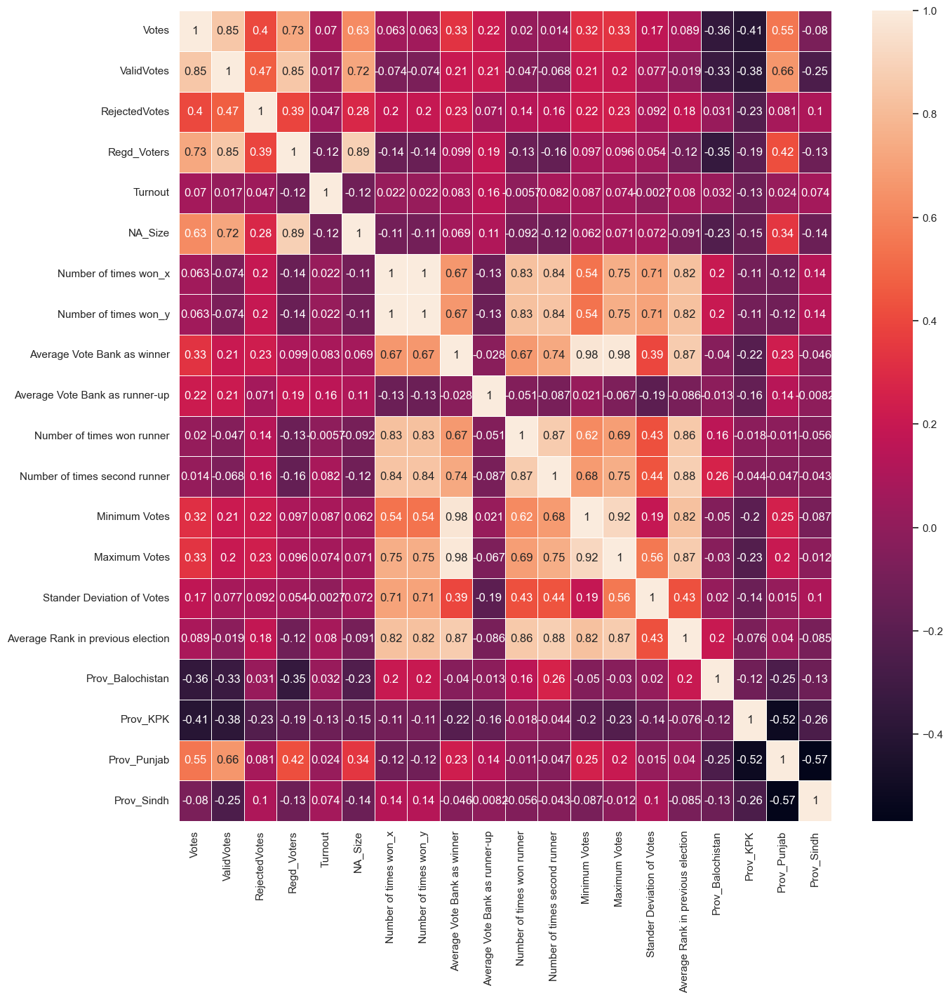

In [188]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(15,15))  
ax=sns.heatmap(X_train.corr(), annot = True,linewidths=.5)

# Machine Learning Models

For this exercise we will take a look at 
- Decision Trees
- Random Forest
- Support Vector Machines (SVM)
- K Nearest Neighbors 

Cursory Look at the model results suggest that Random Forest will be our best initial model with an accuracy of 79%. However, many of the other models performance is not too far off. 

The other interesting result is that all of the models classify Obesity_Type_III amazingly well with >= 98% accuracy across all models. 

In [189]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.preprocessing import StandardScaler # Import for standard scaling of the data
from sklearn.preprocessing import MinMaxScaler # Import for standard scaling of the data

# standard scale data
ss = StandardScaler()
X_train_scaled = ss.fit_transform(X_train)
X_test_scaled = ss.transform(X_test)

# tested MinMaxScaler as KNN historically does better with MinMax
mm = MinMaxScaler()
X_train_mm_scaled = ss.fit_transform(X_train)
X_test_mm_scaled = ss.transform(X_test)

# program to run multilple models though sklearn 
# Default settings output accuracy and classification report
# compares accuracy for scaled and unscaled data
def run_models(X_train: pd.DataFrame , y_train: pd.DataFrame, X_test: pd.DataFrame, y_test: pd.DataFrame):
    
    models = [          
          ('Random Forest', RandomForestClassifier(random_state=0)),
          ('Decision Tree', DecisionTreeClassifier()),                                                 
          ('KNN', KNeighborsClassifier()),
          ('SVM', SVC())
        ]  
    
    for name, model in models:        
        # unscaled data
        clf = model.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        
        # scaled data
        clf_scaled = model.fit(X_train_scaled, y_train)
        y_pred_scaled = clf_scaled.predict(X_test_scaled)
        
        # mm scaled data
        clf_mm_scaled = model.fit(X_train_mm_scaled, y_train)
        y_pred_mm_scaled = clf_scaled.predict(X_test_mm_scaled)
        
        # accuracy scores
        accuracy = round(metrics.accuracy_score(y_test, y_pred),5)
        scaled_accuracy = round(metrics.accuracy_score(y_test, y_pred_scaled),5)
        scaled_mm_accuracy = round(metrics.accuracy_score(y_test, y_pred_mm_scaled),5)
        
        # output
        print(name + ':')        
        print("---------------------------------------------------------------")      
        print("Accuracy:", accuracy)
        print("Accuracy w/Scaled Data (ss):", scaled_accuracy)
        print("Accuracy w/Scaled Data (mm):", scaled_mm_accuracy)
        if (accuracy > scaled_accuracy) and (accuracy > scaled_mm_accuracy):
            print("\nClassification Report:\n", metrics.classification_report(y_test, y_pred))      
            print("                            -----------------------------------               \n")      
        elif (scaled_accuracy > scaled_mm_accuracy):
            print("\nClassification Report (ss):\n", metrics.classification_report(y_test, y_pred_scaled))      
            print("                            -----------------------------------               \n")     
        else:            
            print("\nClassification Report (mm):\n", metrics.classification_report(y_test, y_pred_mm_scaled))      
            print("                            -----------------------------------               \n")      

In [190]:
#run Decision Trees, Random Forest, KNN and SVM
run_models(X_train, y_train, X_test, y_test)

Random Forest:
---------------------------------------------------------------
Accuracy: 0.80392
Accuracy w/Scaled Data (ss): 0.80392
Accuracy w/Scaled Data (mm): 0.80392

Classification Report (mm):
               precision    recall  f1-score   support

      Others       1.00      0.60      0.75        10
         PML       0.73      0.79      0.76        14
         PPP       0.80      1.00      0.89         8
         PTI       0.80      0.84      0.82        19

    accuracy                           0.80        51
   macro avg       0.83      0.81      0.80        51
weighted avg       0.82      0.80      0.80        51

                            -----------------------------------               

Decision Tree:
---------------------------------------------------------------
Accuracy: 0.7451
Accuracy w/Scaled Data (ss): 0.78431
Accuracy w/Scaled Data (mm): 0.76471

Classification Report (ss):
               precision    recall  f1-score   support

      Others       0.67      

# Hyperparameter Tuning

Searching for better performance out of the models with Gridsearch

In [191]:
from sklearn.model_selection import GridSearchCV

#model name, classifier, parameters
# function used to process models and parameters through gridsearch
def hyper_tune(name, clf, parameters, target_names=None): 
    
    target_names = target_names
    clf = clf
    search = GridSearchCV(clf, parameters,verbose=True, n_jobs=15, cv=5)
    search.fit(X_train_scaled,y_train)
    y_pred_scaled = search.predict(X_test_scaled)
    print ("Accuracy Score = %3.2f" %(search.score(X_test_scaled,y_test)))
    print (search.best_params_)
    print("\nClassification Report:\n", metrics.classification_report(y_test, y_pred_scaled, target_names=target_names))

In [192]:
#the KNN model performs better on the unscaled data this function
# function for unscaled data
#model name, classifier, parameters
# function used to process models and parameters through gridsearch
def hyper_tune2(name, clf, parameters, target_names=None): 
    
    target_names = target_names
    clf = clf
    search = GridSearchCV(clf, parameters,verbose=True, n_jobs=15, cv=5)
    search.fit(X_train,y_train)
    y_pred = search.predict(X_test)
    print ("Accuracy Score = %3.2f" %(search.score(X_test,y_test)))
    print (search.best_params_)
    print("\nClassification Report:\n", metrics.classification_report(y_test, y_pred, target_names=target_names))

In [193]:
# Number of trees in random forest
n_estimators = [int(x) for x in range(10, 200,10)]
# Criterion
criterion = ['gini','entropy']
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in range(10, 100, 10)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [int(x) for x in range(1, 5)]
# Minimum number of samples required at each leaf node
min_samples_leaf = [int(x) for x in range(1, 5)]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# random state
random_state = [0]

parameters = { 'criterion':criterion,
               'n_estimators': n_estimators,
              'max_depth':max_depth,
              #'random_state': random_state,
              #'max_features':max_features,
              #'min_samples_split':min_samples_split             
               }


hyper_tune('Random Forest',
           RandomForestClassifier(), parameters)

Fitting 5 folds for each of 380 candidates, totalling 1900 fits
Accuracy Score = 0.76
{'criterion': 'entropy', 'max_depth': 30, 'n_estimators': 50}

Classification Report:
               precision    recall  f1-score   support

      Others       1.00      0.50      0.67        10
         PML       0.69      0.79      0.73        14
         PPP       0.88      0.88      0.88         8
         PTI       0.73      0.84      0.78        19

    accuracy                           0.76        51
   macro avg       0.82      0.75      0.76        51
weighted avg       0.79      0.76      0.76        51



# Feature Importance w/ Random Forest

In [194]:
# Create Decision Tree classifer object with optimized parameters
clf = RandomForestClassifier(criterion='entropy',
               n_estimators=90,
              max_depth = 80,              
              max_features='auto',
              min_samples_split=2,
              random_state=0)

# Train Decision Tree Classifer
clf = clf.fit(X_train_scaled,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test_scaled)

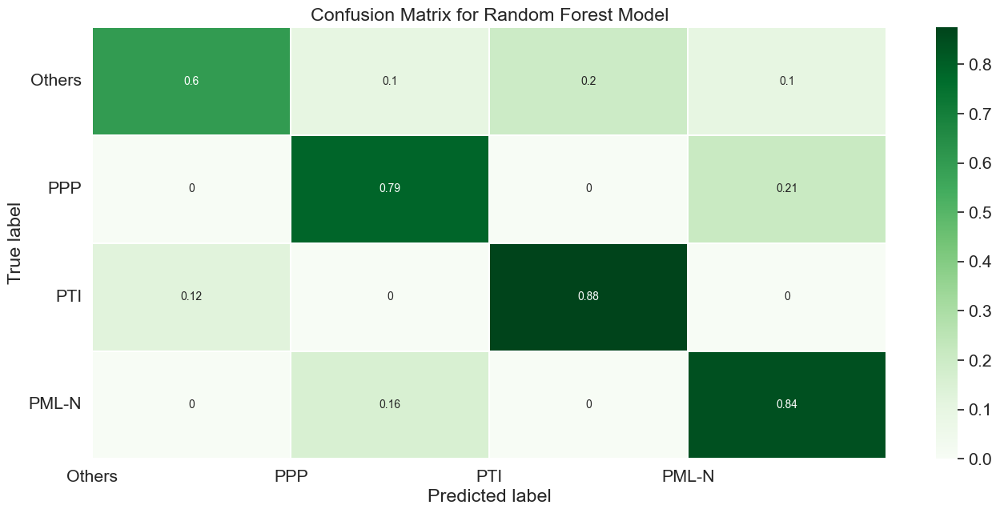

In [195]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test, y_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

# Add labels to the plot
class_names = ['Others', 'PPP', 'PTI', 'PML-N']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=0)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Random Forest Model')
plt.show()

In [196]:
print(X.columns)

Index(['Votes', 'ValidVotes', 'RejectedVotes', 'Regd_Voters', 'Turnout',
       'NA_Size', 'Number of times won_x', 'Number of times won_y',
       'Average Vote Bank as winner', 'Average Vote Bank as runner-up',
       'Number of times won runner', 'Number of times second runner',
       'Minimum Votes', 'Maximum Votes', 'Stander Deviation of Votes',
       'Average Rank in previous election', 'Prov_Balochistan', 'Prov_KPK',
       'Prov_Punjab', 'Prov_Sindh'],
      dtype='object')


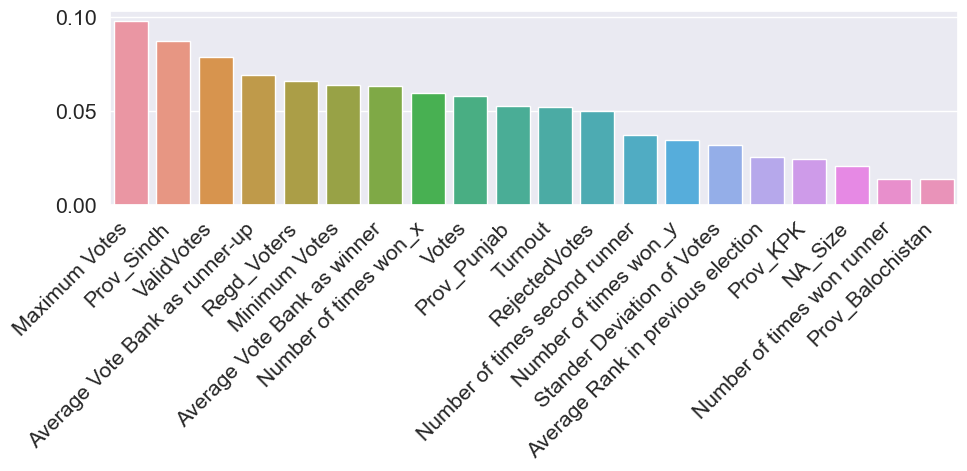


Top 10 Features:
Variable: Maximum Votes        Importance: 0.1
Variable: Prov_Sindh           Importance: 0.09
Variable: ValidVotes           Importance: 0.08
Variable: Regd_Voters          Importance: 0.07
Variable: Average Vote Bank as runner-up Importance: 0.07
Variable: Votes                Importance: 0.06
Variable: Number of times won_x Importance: 0.06
Variable: Average Vote Bank as winner Importance: 0.06
Variable: Minimum Votes        Importance: 0.06
Variable: RejectedVotes        Importance: 0.05

Bottom 10 Features:
Variable: Number of times won runner Importance: 0.01
Variable: Prov_Balochistan     Importance: 0.01
Variable: NA_Size              Importance: 0.02
Variable: Prov_KPK             Importance: 0.02
Variable: Number of times won_y Importance: 0.03
Variable: Stander Deviation of Votes Importance: 0.03
Variable: Average Rank in previous election Importance: 0.03
Variable: Number of times second runner Importance: 0.04
Variable: RejectedVotes        Importance: 0.

In [197]:
feature_imp = pd.Series(clf.feature_importances_, index=X.columns).sort_values(ascending=False)
fig = plt.figure(figsize=(10, 5))

# Creating a bar plot
sns.barplot(x=feature_imp.index, y=feature_imp)

# Add labels to your graph
plt.xticks(rotation=45, horizontalalignment='right')

plt.tight_layout()
plt.show()

# create features list
features_list = X.columns
features_list = features_list.tolist()

# Get numerical feature importances
importances = list(clf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(features_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
print("\nTop 10 Features:")
display_top = [print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances[:10]]

# Sort the feature importances by least important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = False)
# Print out the feature and importances 
print("\nBottom 10 Features:")
display_bottom = [print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances[:10]]

<h2 style="text-align: center;"> The End </h2>